
# <span style="color:rgb(213,80,0)">Santos Port Throughput Analysis</span>
<a name="beginToc"></a>

## Table of Contents
&emsp;[Overview](#overview)

&emsp;[Objective](#objective)

&emsp;[Import and Preprocessing the Data](#import-and-preprocessing-the-data)

&emsp;[Exploratory Analysis](#exploratory-analysis)

&emsp;&emsp;[Understanding Trend and Seasonality](#understanding-trend-and-seasonality)

&emsp;&emsp;[Understanding Variability](#understanding-variability)

&emsp;[Data Transformation](#data-transformation)

&emsp;&emsp;[Addressing Heteroscedasticity](#addressing-heteroscedasticity)

&emsp;&emsp;[Splitting Series into Train and Test Sets](#splitting-series-into-train-and-test-sets)

&emsp;&emsp;[Time Series Decomposition](#time-series-decomposition)

&emsp;[Modeling th Components](#modeling-th-components)

&emsp;&emsp;[Long\-Term and Seasonal Components](#long-term-and-seasonal-components)

&emsp;&emsp;[Residual Component](#residual-component)

&emsp;&emsp;&emsp;[Stationarity Tests](#stationarity-tests)

&emsp;&emsp;&emsp;[Model Selection and Training](#model-selection-and-training)

&emsp;&emsp;&emsp;[Residuals Analysis](#residuals-analysis)

&emsp;[Forecasting Data](#forecasting-data)

&emsp;[Conclusions and Future Analysis](#conclusions-and-future-analysis)

<a name="endToc"></a>

## Overview

The Port of Santos is the largest in Latin America and plays a vital role in Brazil's trade and economy. Located in Santos, São Paulo state, it connects Brazil to more than 600 ports worldwide and is historically responsible for more than 25% of the international trade of the country. As a multipurpose complex, it handles a diverse range of cargo, including solid and liquid bulk, loose general cargo, containerized shipments, and project cargo, Consistently ranking among the top ports in national and international cargo movement analyses \\cite{website}, the port set a new record in 2024 by handling nearly 5 million TEUs (twenty\-foot equivalent unit). This upward trend in container throughput is expected to continue, driven by the steady growth of the global container market.

<p style="text-align:left">
   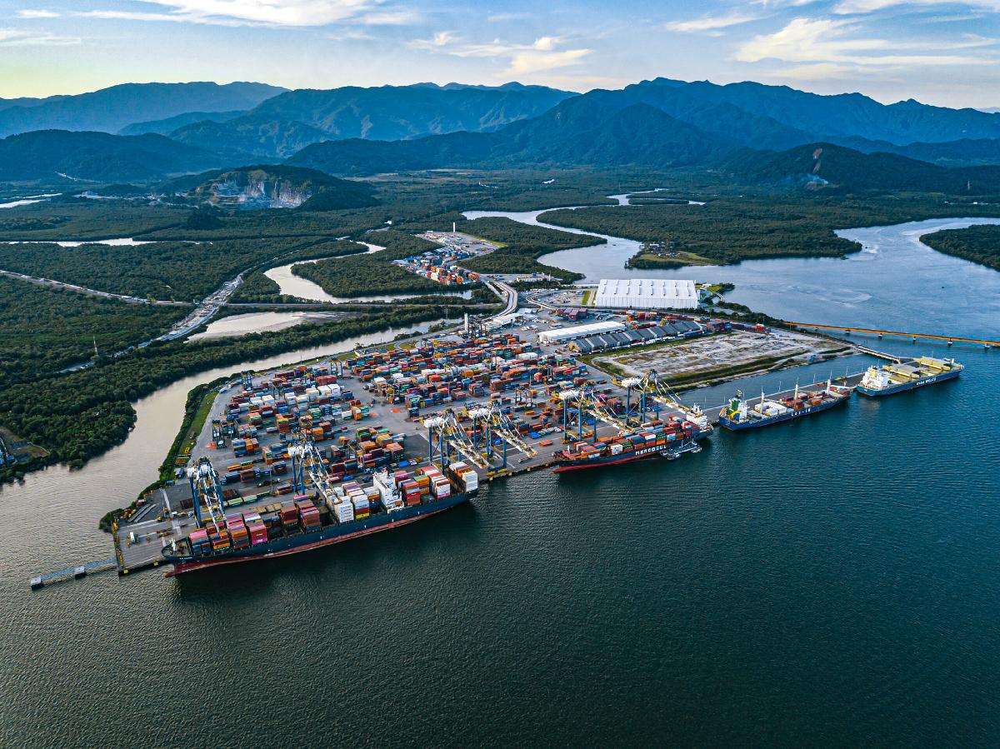
</p>


## Objective

This study aims to analyze the time series of container cargo throughput at the Port of Santos to identify trends, seasonality, and patterns in port activity. Additionally, the study aims to perform forecasting to predict future throughput and provide insights for terminals, shippers, authorities and other stakeholders.. The dataset used is provided by the Santos Port Authority and is available for download on the organization's website.

## Import and Preprocessing the Data

In [1]:
clear
close
clc
warning("off")
format shortG

data = import_aps_data;
head(data)

      Ano        Mês         DESC_SIMPLES        TIPO_INSTALAÇÃO (grupos)       Terminal - GERIN             naturezacarga           TIPO_MOVIMENTO        navegacao        Sentido_carga           desc_spa          Toneladas    TEUs    Unidades
    ________    _____    ____________________    ________________________    _______________________    ________________________    ________________    _______________    _______________    ____________________    _________    ____    ________
    {'2025'}    {'1'}    {'I. BARNABE OESTE'}      {'PORTO ORGANIZADO'}      {'AGEO'               }    {'GRANEL LIQUIDO'      }    {'CONVENCIONAL'}    {'CABOTAGEM'  }    {'DESEMBARQUE'}    {'ÓLEO DIESEL'     }     1700.7        0         0   
    {'2025'}    {'1'}    {'I. BARNABE OESTE'}      {'PORTO ORGANIZADO'}      {'AGEO'               }    {'GRANEL LIQUIDO'      }    {'CONVENCIONAL'}    {'LONGO CURSO'}    {'DESEMBARQUE'}    {'METANOL'         }       1997        0         0   
    {'2025'}    {'1'}   

In [2]:
% Visualize the variable names and type and the number of observations
disp([data.Properties.VariableNames; data.Properties.VariableTypes]')

    "Ano"                         "cell"  
    "Mês"                         "cell"  
    "DESC_SIMPLES"                "cell"  
    "TIPO_INSTALAÇÃO (grupos)"    "cell"  
    "Terminal - GERIN"            "cell"  
    "naturezacarga"               "cell"  
    "TIPO_MOVIMENTO"              "cell"  
    "navegacao"                   "cell"  
    "Sentido_carga"               "cell"  
    "desc_spa"                    "cell"  
    "Toneladas"                   "double"
    "TEUs"                        "double"
    "Unidades"                    "double"

In [3]:
% Compute number of observations and columns
data_size = array2table([height(data) width(data)],"VariableNames",["no_of_observations" "no_of_columns"]);
disp(data_size)

    no_of_observations    no_of_columns
    __________________    _____________
        2.8842e+05             13


<samp>The dataset contains over 280,000 observations across 13 columns, including variables such as year, month, terminal, cargo type, units, weight, TEUs, and more.</samp>


In [4]:
% Check the type of cargo
types_of_cargo = unique(data.naturezacarga)

types_of_cargo = 5x1 cell
''                    
'CARGA CONTEINERIZADA'
'CARGA GERAL'         
'GRANEL LIQUIDO'      
'GRANEL SOLIDO'


For the analysis, the dataset is filtered to focus specifically on container cargo by selecting rows where the *naturezadacarga* column is labeled as **CARGA CONTEINERIZADA**. This step excludes other cargo types, such as bulk or general cargo.


In [5]:
container_data = data(data.naturezacarga == "CARGA CONTEINERIZADA",:);


The data is then aggregated by year and month, and a time index is created in the timetable.


In [6]:
% Summarizes the container data by year ("Ano") and month ("Mês")
monthly_data = groupsummary(container_data,["Ano","Mês"],"sum","TEUs");
monthly_data = renamevars(monthly_data,"sum_TEUs","TEUs");

% Create date variable from year and month columns
dates = datetime(str2double(monthly_data.Ano), str2double(monthly_data.("Mês")), 1);

% Create a timetable using dates as time indexes
full_series = table2timetable(monthly_data, 'RowTimes', dates);

% Remove unnecessary variables
full_series.Ano = [];
full_series.("Mês") = [];
full_series.GroupCount = [];


Now it's the dataset is sorted cronologically and it's investigated for regularity (no missing datas) and frequency.


In [7]:
% Sort data by Time
full_series = sortrows(full_series,"Time");

% Determine if input times are regular with respect to calendar unit (month)
[tf, dt] = isregular(full_series,"months")

tf = logical
   1
dt = calendarDuration
   1mo

In [8]:
% Compute time range of the dataset
time_span = [full_series.Properties.StartTime full_series.Time(end)]

time_span = 1x2 datetime
01-Jan-2005  01-Feb-2025


<samp>The data spans January 2005 to February 2025, covering 242 months. It is regular (i.e., no months are missing) and sorted chronologically.</samp>


In [9]:
% Visualyze the first and last rows of the train data
head(full_series)

       Time           TEUs   
    ___________    __________
    01-Jan-2005     1.686e+05
    01-Feb-2005    1.5497e+05
    01-Mar-2005    1.8672e+05
    01-Apr-2005    1.7257e+05
    01-May-2005    2.0218e+05
    01-Jun-2005    1.9235e+05
    01-Jul-2005    2.0301e+05
    01-Aug-2005    2.0998e+05

In [10]:
tail(full_series)

       Time           TEUs   
    ___________    __________
    01-Jul-2024    4.9269e+05
    01-Aug-2024    4.7679e+05
    01-Sep-2024    4.8364e+05
    01-Oct-2024    4.9373e+05
    01-Nov-2024     4.647e+05
    01-Dec-2024    4.7263e+05
    01-Jan-2025    4.6079e+05
    01-Feb-2025    4.3478e+05


The data preprocessing has been completed, and the dataset is now prepared for further analysis and modeling.

## Exploratory Analysis
### Understanding Trend and Seasonality

The figure below shows a run sequence plot of the time series, where the data reveals a noticeable trend with a consistent upward movement over time. Despite some fluctuations, the total TEUs handled at Santos demonstrate a clear long\-term increase since 2005.



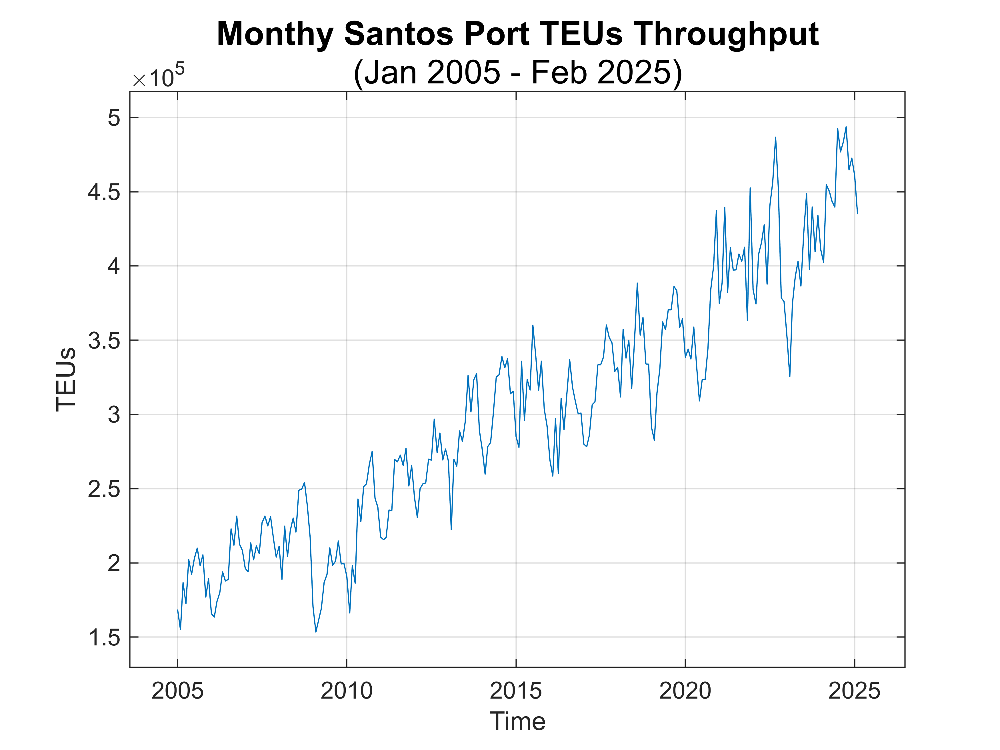

In [11]:
figure
plot(full_series,"Time","TEUs")
title("Monthy Santos Port TEUs Throughput","(Jan 2005 - Feb 2025)","FontSize",14)
axis padded
grid on


The series possibly exhibit some seasonal pattern, with low activity at the beginning of the year and a peak in the second half. The boxplot below demonstrates how the number of TEUs is distributed across the months of the year.



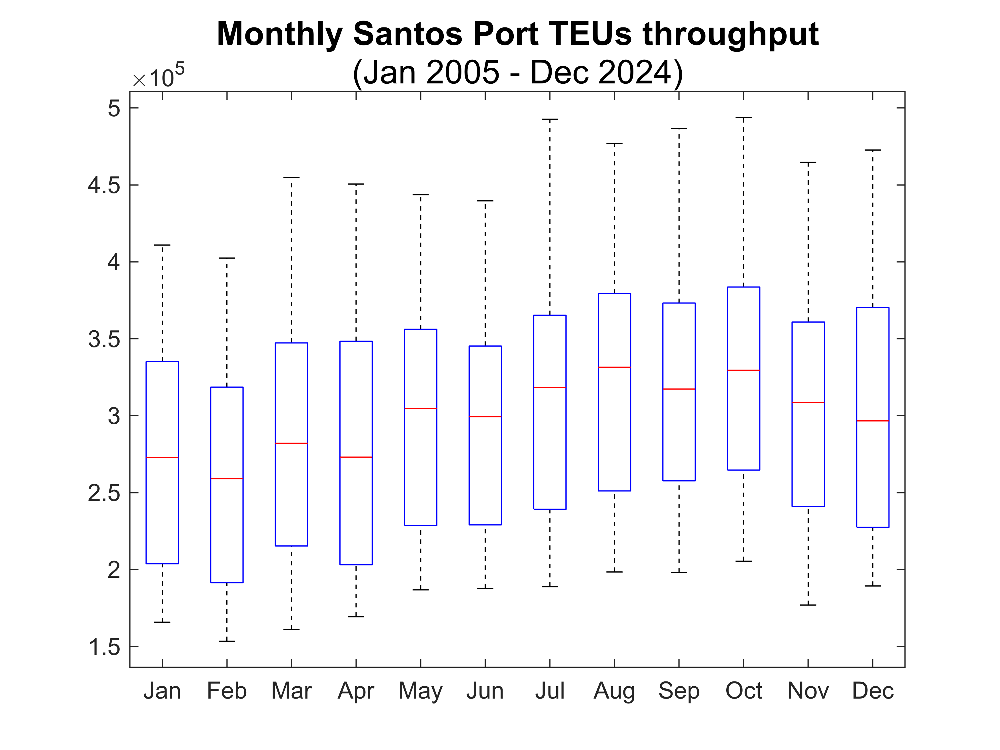

In [12]:
% Get only complete years
complete_years_series = full_series(year(full_series.Time) < 2025, :);

% Generate boxplot with the month labels
figure
month_labels = {'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'};
boxplot(complete_years_series.TEUs,complete_years_series.Time.Month,"Labels",month_labels)
title("Monthly Santos Port TEUs throughput","(Jan 2005 - Dec 2024)","FontSize",14)


Although the medians appear relatively stable and the spread of the boxplots is quite similar across months, some fluctuation in TEU volumes can be observed. To check for significant variation across the periods in the year, the Kruskal\-Wallis test is applied to the detrended quarterly data,



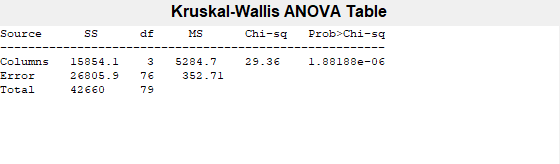

In [13]:
% Detrend the series
complete_years_series.detrended_TEUs = detrend(complete_years_series.TEUs);

% Transform quarters of year into columns
pivot_quarter = pivot(complete_years_series, Rows="Time", RowsBinMethod="year", Columns="Time", ...
    ColumnsBinMethod="quarterofyear", DataVariable="detrended_TEUs", Method="sum", ...
    RowLabelPlacement="rownames");
quarter_labels = {'Q1', 'Q2', 'Q3', 'Q4'};

% Performe Kruskal-Wallis test
[p, ~, stats] = kruskalwallis(table2array(pivot_quarter), quarter_labels);


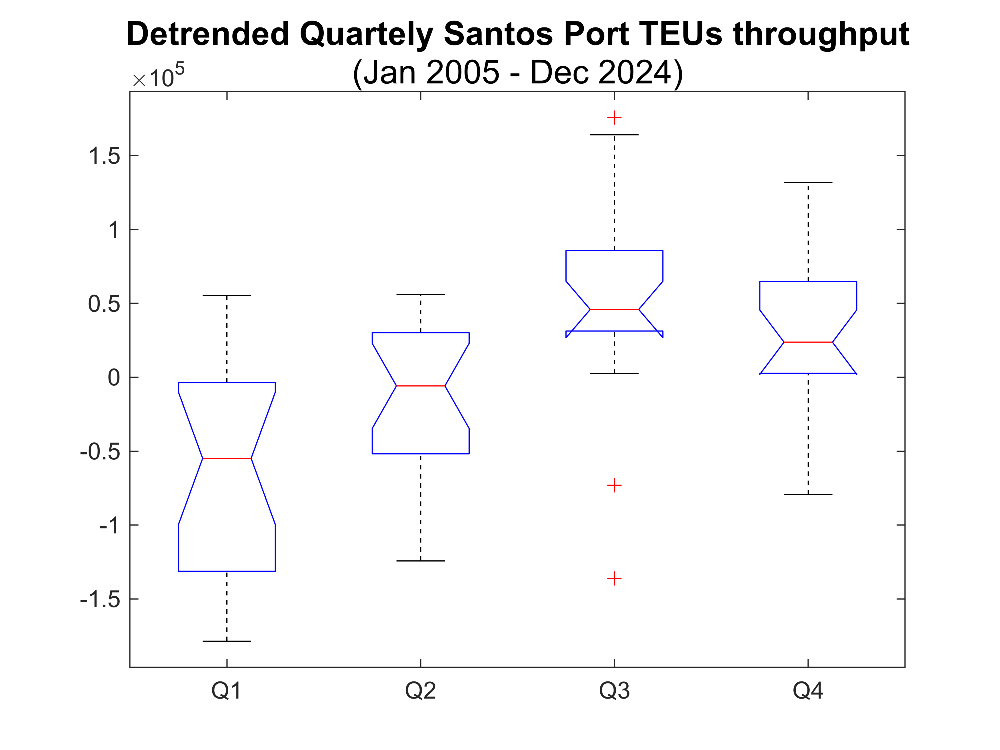

In [14]:
title("Detrended Quartely Santos Port TEUs throughput","(Jan 2005 - Dec 2024)","FontSize",14)

In [15]:
disp(p)

1.8819e-06


The returned value of <samp>p = 1.88e-06</samp> indicates that Kruskal\-Wallis rejects the null hypothesis that all data come from the same distribution at a 1% significance level. As expected, the beginning of the year shows a lower median volume, with the highest volumes concentrated in the second half.


A follow\-up test is conducted to identify which quarter comes from a different distribution


In [16]:
c = multcompare(stats);

Note: Intervals can be used for testing but are not simultaneous confidence intervals.

In [17]:
% Display the multiple comparison results in a table.
multcompare_tbl = array2table(c, "VariableNames", ...
    ["Quarter A","Quarter B","Lower Limit","A-B","Upper Limit","P-value"]);
disp(multcompare_tbl)

    Quarter A    Quarter B    Lower Limit     A-B      Upper Limit     P-value 
    _________    _________    ___________    ______    ___________    _________
        1            2          -32.128      -13.25       5.6285        0.27179
        1            3          -55.828      -36.95      -18.072      2.952e-06
        1            4          -46.678       -27.8      -8.9215      0.0008912
        2            3          -42.578       -23.7      -4.8215      0.0069005
        2            4          -33.428      -14.55       4.3285         0.1955
        3            4          -9.7285        9.15       28.028        0.59801


The results indicate a significant difference between quarters 1 and 3, as well as between quarters 1 and 4, since their p\-values are below 0.05. This suggests that the test rejects the null hypothesis, meaning the data in these groups likely come from different distributions. Similarly, the test also rejects the null hypothesis for quarters 2 and 3, indicating a significant difference between these groups. However, there is no significant difference between quarters 1 and 2, quarters 2 and 4, or quarters 3 and 4, as their p\-values are above 0.05.


A comparison of the mean ranks across quarter is plotted below.



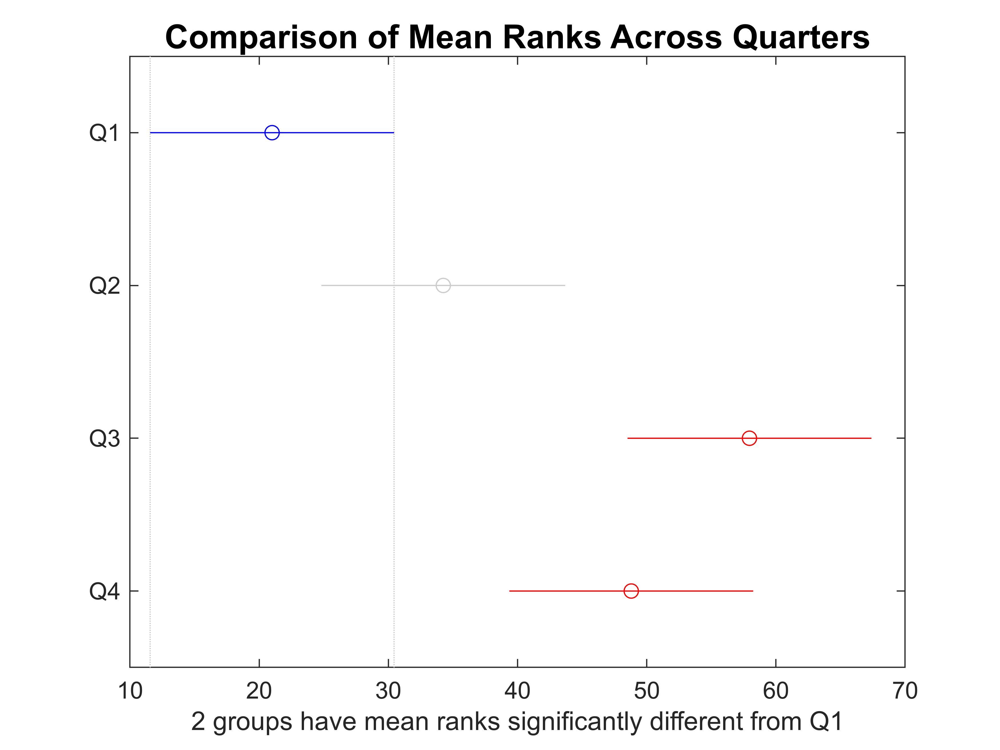

In [18]:
title("Comparison of Mean Ranks Across Quarters","FontSize",14)

### Understanding Variability

Another important characteristic to verify is the heterocedasticity, which refers to the changing level of variability across different values of the series. To explore this further, the relationship between the mean and the standard deviation is plotted below.



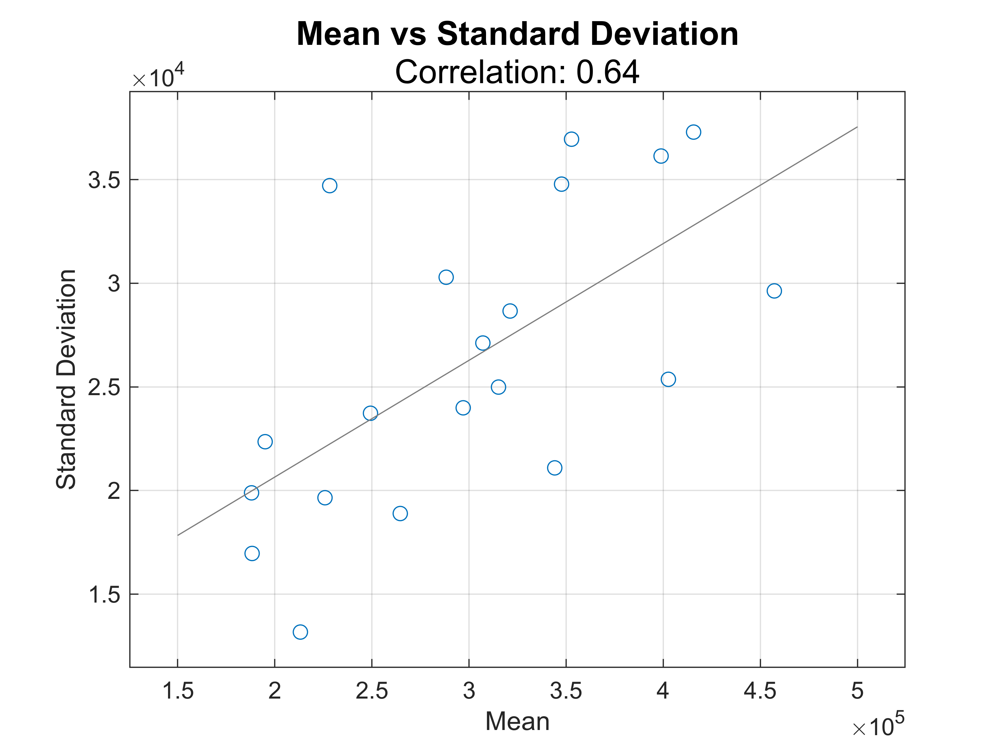

In [19]:
% Group the series yearly
yearly_series = groupsummary(complete_years_series,"Time","year",["sum", "mean", "std"],"TEUs");
yearly_series.GroupCount = [];

% Create the scatter plot
figure
scatter(yearly_series,"mean_TEUs","std_TEUs")
lsline
title("Mean vs Standard Deviation",sprintf('Correlation: %.2f',corr(yearly_series.mean_TEUs,yearly_series.std_TEUs)),"FontSize",14)
box on; grid on; axis padded
xlabel("Mean"); ylabel("Standard Deviation")


As seen, a clear positive correlation between the mean and the standard deviation is evident, indicating that as the mean increases, so does the variability of the data. This relationship suggests that in periods of higher throughput, fluctuations are more pronounced.

## Data Transformation

Trends and changes in variability indicate non\-stationarity in the time series, which can affect analysis and predictive models. To address this, it is necessary to transform the data appropriately. These transformations aim to stabilize the variance and bring the time series closer to stationarity. Additionally, it is important to decompose the time series to identify and separate the trend and periodicity components, allowing for more accurate data analysis.


All transformations performed will be reversed later to ensure accurate predictions and maintain interpretability.

### Addressing Heteroscedasticity

To address the heteroscedasticity identified in the data, we will apply a logarithmic transformation, as there is a positive correlation between mean and the standard deviations in the yearly TEUs volume.


In [20]:
complete_years_series.log_TEUs = log(complete_years_series.TEUs);

% Compare the data range before and after the logarithmic transformation
original_range = [min(complete_years_series.TEUs),max(complete_years_series.TEUs)]

original_range = 1x2
      153409      493727

In [21]:
transformed_range = [min(complete_years_series.log_TEUs),max(complete_years_series.log_TEUs)]

transformed_range = 1x2
       11.941        13.11


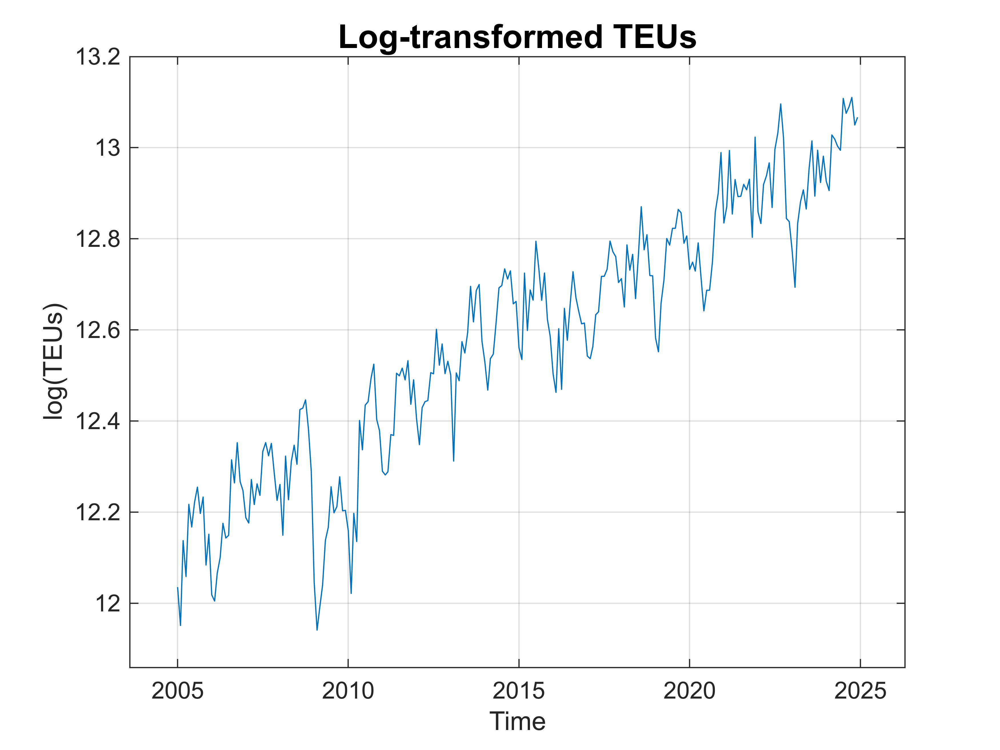

In [22]:
% Visualize the transformed data
figure;
plot(complete_years_series.Time,complete_years_series.log_TEUs);
title("Log-transformed TEUs","FontSize",14);
xlabel("Time"); ylabel("log(TEUs)");
axis padded; grid on;


Let's visually compare the mean and standard deviation of the original and the transformed data.



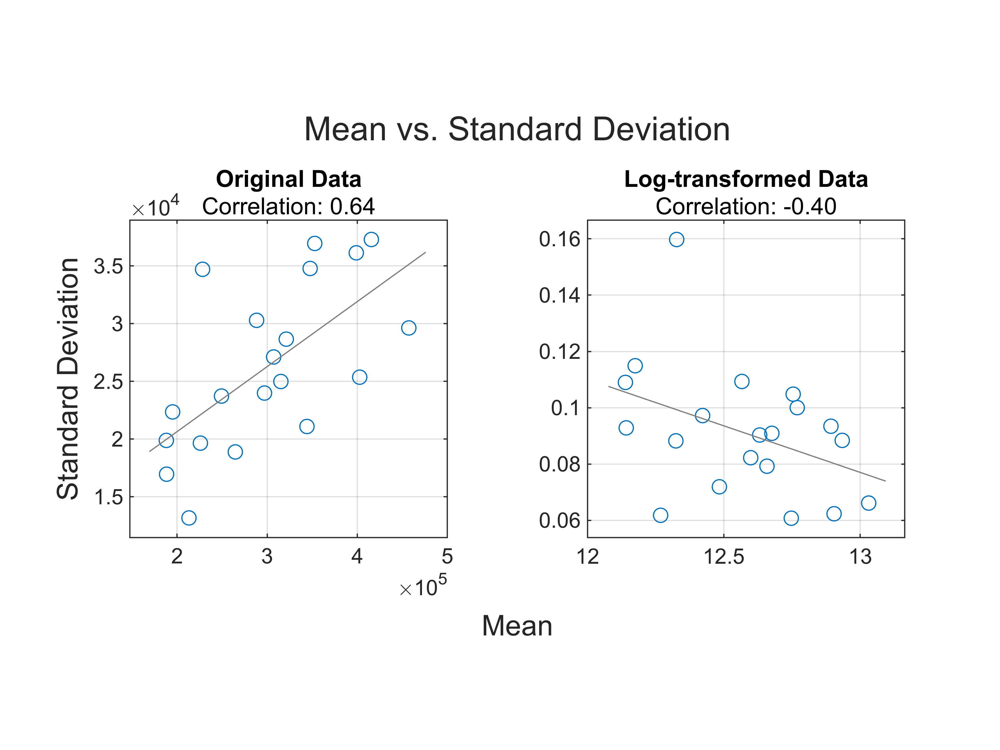

In [23]:
% Group series yearly with TEUs and log_TEUs
yearly_series = groupsummary(complete_years_series,"Time","year",["sum", "mean", "std"],["TEUs","log_TEUs"]);

% Plot mean vs standard deviation of the original and the log-transformed
% series
figure
t = tiledlayout(1,2);
title(t,"Mean vs. Standard Deviation","FontSize",14)
xlabel(t,'Mean')
ylabel(t,'Standard Deviation')

% Generate plot for mean vs standard of the original series
nexttile
scatter(yearly_series,"mean_TEUs","std_TEUs")
title("Original Data")
subtitle(sprintf('Correlation: %.2f',corr(yearly_series.mean_TEUs,yearly_series.std_TEUs)))
grid on; box on; axis square padded
xlabel(''); ylabel('')
lsline

% Generate plot for mean vs standard of the log-transformed series
nexttile
scatter(yearly_series, "mean_log_TEUs", "std_log_TEUs")
title("Log-transformed Data")
subtitle(sprintf('Correlation: %.2f', corr(yearly_series.mean_log_TEUs,yearly_series.std_log_TEUs)))
grid on; box on
xlabel(''); ylabel('')
axis padded square
lsline


The log\-transformed series exhibits a weaker correlation between its mean and standard deviation compared to the original series, indicating that it is closer to homoscedasticity. Therefore, the transformed data will be used for modeling.

### Splitting Series into Train and Test Sets

Data up to December 2023 will be used for training the models, while data from 2024 onward will be reserved for testing.



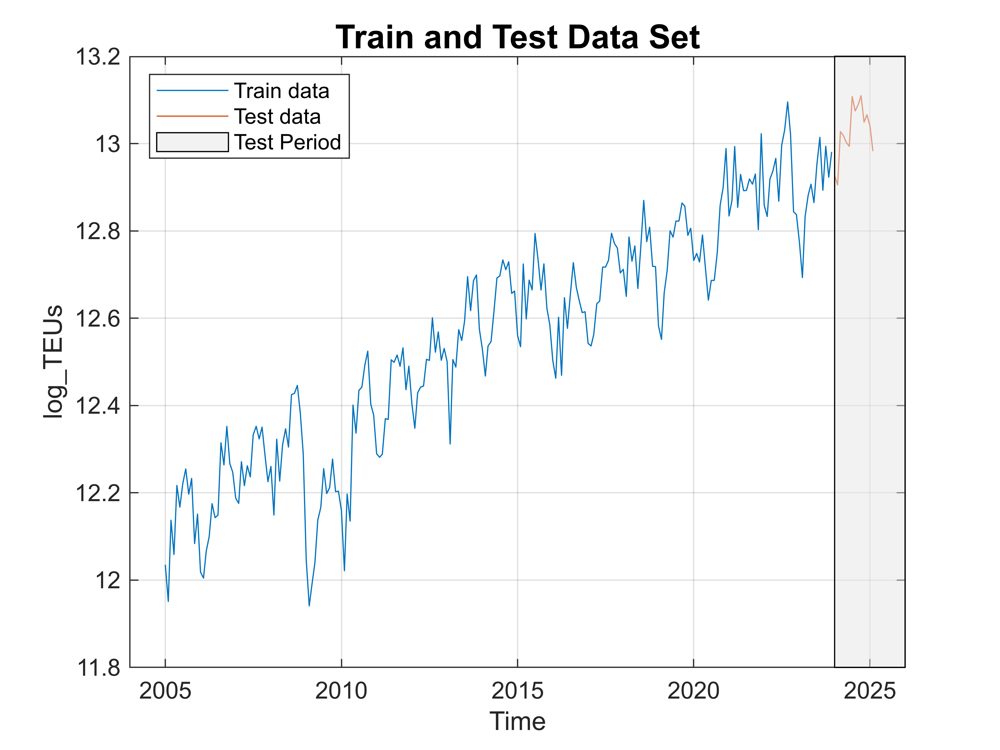

In [24]:
% Create log_teus column in the full series
full_series.log_TEUs = log(full_series.TEUs);

% Split the dataset
train_data = full_series(year(full_series.Time) <= 2023, "log_TEUs");
test_data = full_series(year(full_series.Time) > 2023, "log_TEUs");

% Retrieve
train_data.TEUs = exp(train_data.log_TEUs);
test_data.TEUs = exp(test_data.log_TEUs);

% Plot the series
figure
plot(train_data,"Time", "log_TEUs")
ylim([11.8 13.2]); xlim(datetime({'01-Jan-2004' '01-Jan-2026'}))
hold on
plot(test_data,"Time", "log_TEUs")
px = datetime({'01-Jan-2024', '01-Jan-2026', '01-Jan-2026', '01-Jan-2024'});
py = [11.8 11.8 13.2 13.2];
hf = patch(px,py,[0.9 0.9 0.9], "FaceAlpha", 0.5);
grid on
legend(["Train data", "Test data", "Test Period"], "Location", "northwest")
title("Train and Test Data Set", "FontSize", 14)

### Time Series Decomposition

Breaking down a time series into its fundamental components is essential for understanding underlying patterns and improving forecasting accuracy. These components include:

-  Long\-term trend \-\- The overall direction of the data over time;
-  Seasonal component \-\- Reccuring patterns or cycles that repeat at regular intervals;
-  Residual component \-\- The remaining variatios after removing trend and seasonality.

In [25]:
% Decompose the series
[LT, ST, R] = trenddecomp(train_data.log_TEUs, "NumSeasonal", 1);

% Create table trends
trends = array2timetable([LT, ST, R], "VariableNames", ["long_term", "seasonal", "remainder"], "RowTimes", train_data.Time);


By isolating these elements, a clearer interpretation of the data is achieved, facilitating more precise predictions. The charts below show all the components isolated, as well as the log\-transformed series.



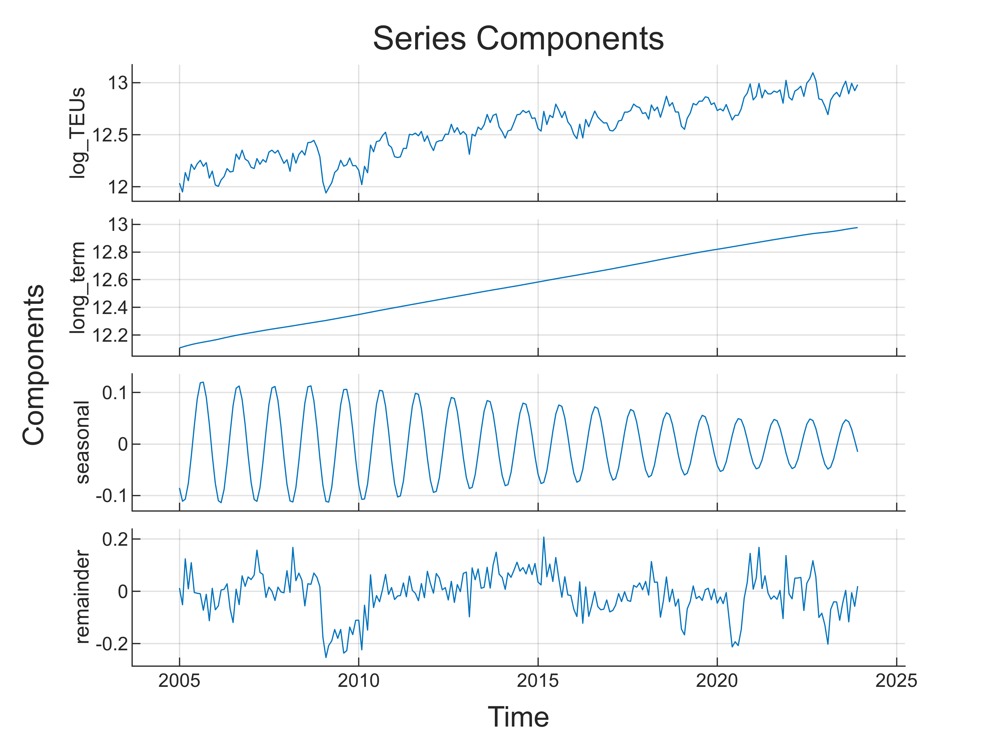

In [26]:
% Plot the components
figure
t = tiledlayout("vertical");
t.TileSpacing = "compact";
title(t,"Series Components","FontSize",14)
xlabel(t,"Time"); ylabel(t,"Components")

% Log-transformed series
nexttile
plot(train_data,"Time","log_TEUs")
set(gca,"XTickLabels",[])
axis padded; box off; grid on; xlabel([])

% Long-term
nexttile
plot(trends,"Time","long_term")
set(gca,"XTickLabels",[])
axis padded; box off; grid on; xlabel([])

% Seasonal
nexttile
plot(trends,"Time","seasonal")
set(gca,"XTickLabels",[])
axis padded; box off; grid on; xlabel([])

% Remainder
nexttile
plot(trends,"Time","remainder")
axis padded; box off; grid on; xlabel([])


Once different modeling approaches will be used for the components and the remainder, let's create a separate table only for the remaining time series.


In [27]:
% Create remaining series table
remaining_series = timetable(trends.Time, trends.remainder, VariableNames="remainder");


## Modeling th Components
### Long\-Term and Seasonal Components

The long\-term component approximates a linear trend and will therefore be modeled as a first\-degree polynomial in the form $P\left(x\right)=p_1 x+p_2$



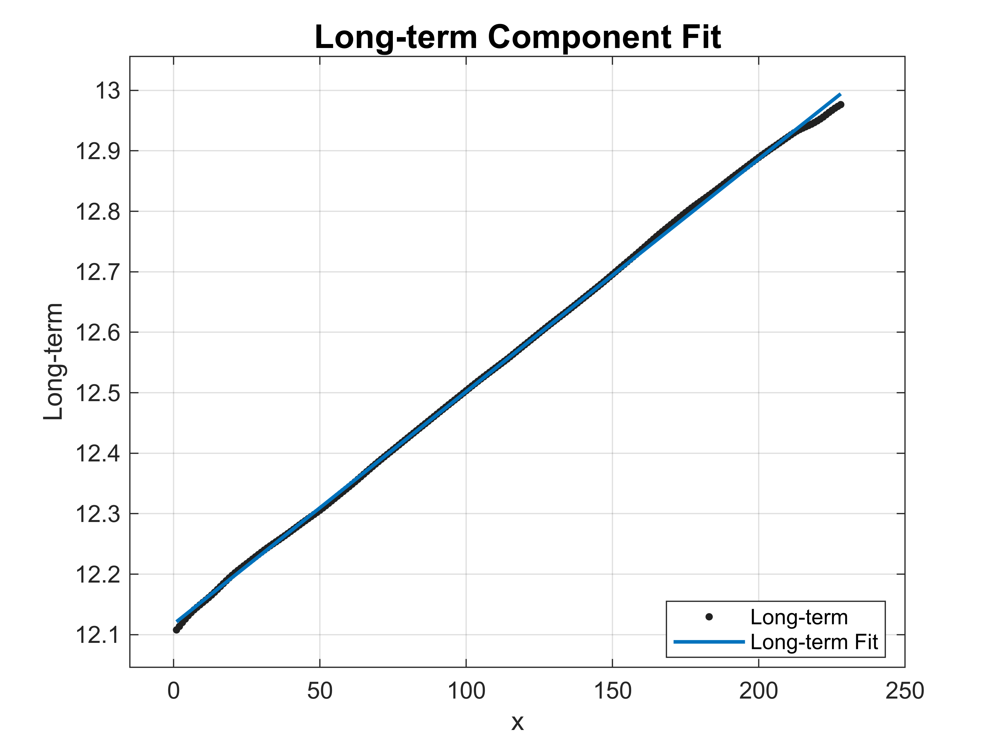

In [28]:
[long_term_mdl, long_term_gof] = createLongTermFit(trends.long_term);
title("Long-term Component Fit", "FontSize", 14)
legend(["Long-term","Long-term Fit"], "Location","best")
xlabel("x"); ylabel("Long-term")
axis padded; grid on

In [29]:
disp(long_term_gof)

           sse: 0.0052654
       rsquare: 0.99964
           dfe: 226
    adjrsquare: 0.99964
          rmse: 0.0048268


The seasonal component exhibits periodic behavior and will therefore be modeled as the sum of two sine terms to capture its cyclic patterns in the form $S\left(x\right)=a_1 \sin \left(b_1 x+c_1 \right)+a_2 \sin \left(b_2 x+c_2 \right)$



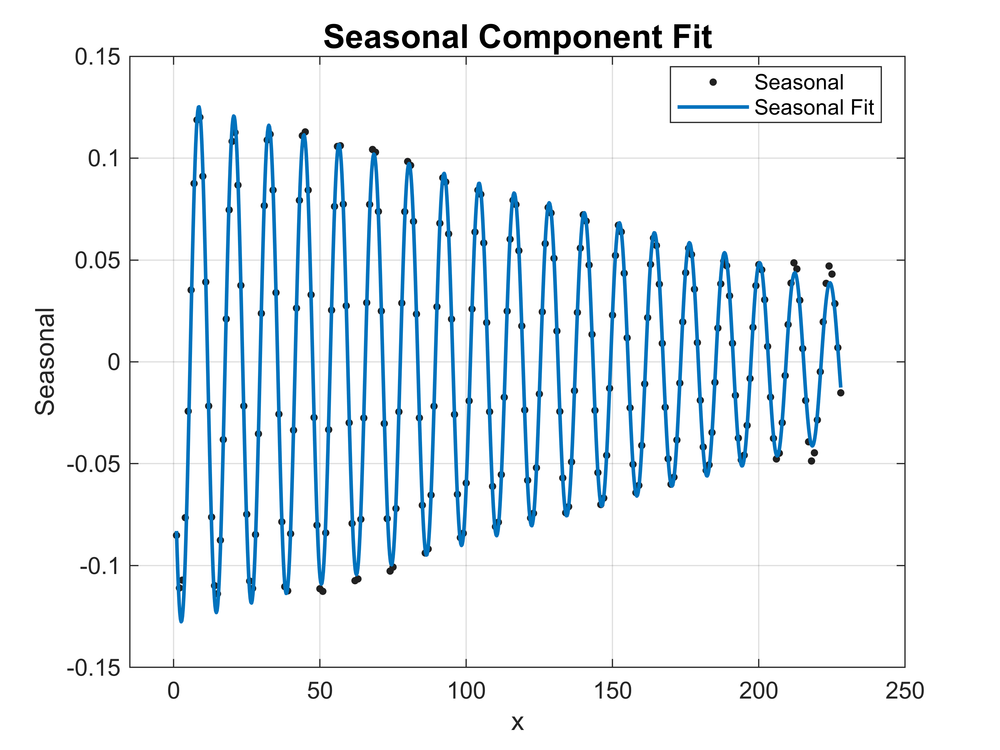

In [30]:
[seasonal_mdl, seasonal_gof] = createSeasonalFit(trends.seasonal);
title("Seasonal Component Fit", "FontSize", 14)
legend(["Seasonal","Seasonal Fit"], "Location","best")
xlabel("x"); ylabel("Seasonal")
axis padded; grid on

In [31]:
disp(seasonal_gof)

           sse: 0.0016987
       rsquare: 0.99806
           dfe: 222
    adjrsquare: 0.99801
          rmse: 0.0027662


Both models appear to fit the data well, as indicated by the goodness\-of\-fit metrics.


The next step is to analyze the remaining data by applying statistical models to capture residual patterns not explained by these components, further enhancing the forecasting accuracy.


In [32]:
% Previous index
prev_idx = height(train_data)

prev_idx = 
   228


### Residual Component
#### Stationarity Tests

The augmented Dickey–Fuller (ADF) test checks for the presence of a unit root in the time series. Its null hypothesis states that the series has a unit root, meaning it is non\-stationary. The Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test, on the other hand, assesses whether a time series is trend\-stationary. Its null hypothesis states that the series is stationary. Using both tests together can provide stronger evidence regarding stationarity. If the ADF test rejects non\-stationarity while the KPSS test does not reject stationarity, the series is likely to be stationary.


In [33]:
% Check for a unit root with ADF test
disp(adftest(remaining_series))

                h      pValue     stat      cValue     Lags    Alpha    Model      Test 
              _____    ______    _______    _______    ____    _____    ______    ______
    Test 1    true     0.001     -7.8876    -1.9421     0      0.05     {'AR'}    {'T1'}

In [34]:
% Check for a trend with KPSS test
disp(kpsstest(remaining_series, "Trend", false))

                h       pValue      stat     cValue    Lags    Alpha    Trend
              _____    ________    ______    ______    ____    _____    _____
    Test 1    true     0.041171    0.5022    0.463      0      0.05     false


The results of the ADF and KPSS tests are conflicting: the ADF test suggests stationarity by rejecting its null hypothesis, while the KPSS test indicates non\-stationarity by failing to reject its null hypothesis. To resolve this, I will apply additional transformations, specifically differentiation, to remove trends and stabilize the variance. After these transformations, I will reapply the KPSS test to reassess the stationarity of the series.


In [35]:
% Non-seasonal differenced
non_seasonal_differenced = diff(remaining_series);

% Apply KPSS test on the differenced series
disp(kpsstest(non_seasonal_differenced, "Trend", false))

                h      pValue      stat       cValue    Lags    Alpha    Trend
              _____    ______    _________    ______    ____    _____    _____
    Test 1    false     0.1      0.0055442    0.463      0      0.05     false


The result indicates stationarity, providing clear evidence that the series no longer exhibits a unit root. This confirms that a single differentiation was sufficient to achieve stationarity, identifying the parameter <samp>d = 1</samp> for an ARIMA model.



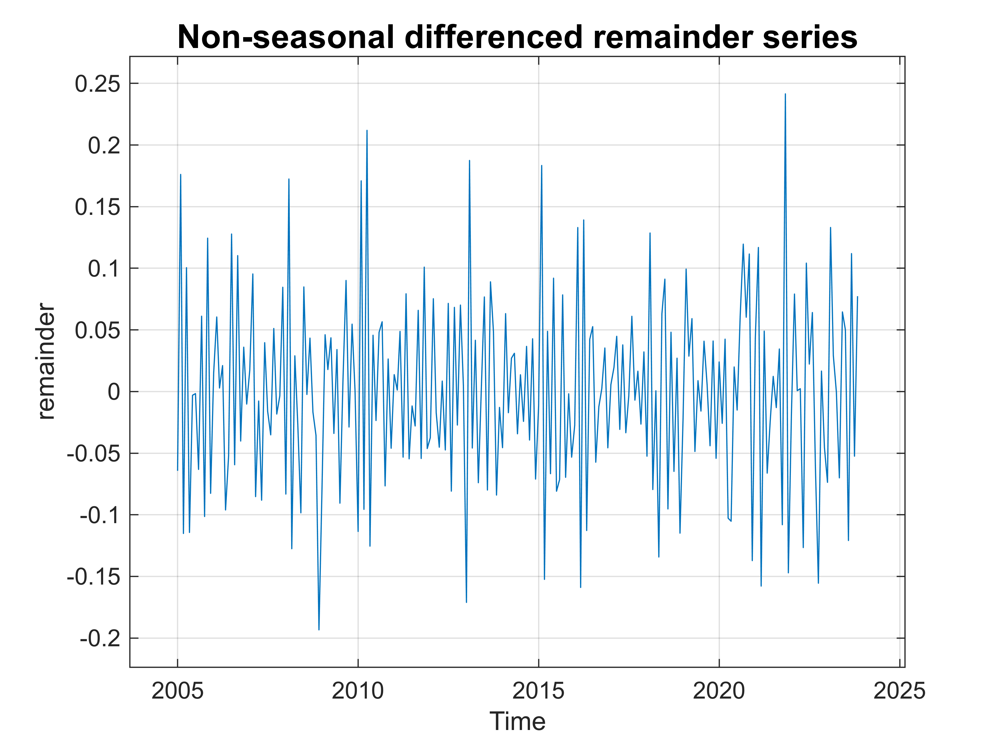

In [36]:
% Plot the non-seasonal differenced series
figure
plot(non_seasonal_differenced, "Time", "remainder")
title("Non-seasonal differenced remainder series", "FontSize", 14)
axis padded; grid on


I will now proceed to analyze the autocorrelation function (ACF) and partial autocorrelation function (PACF) plots to determine the appropriate autoregressive (AR) and moving average (MA) terms.



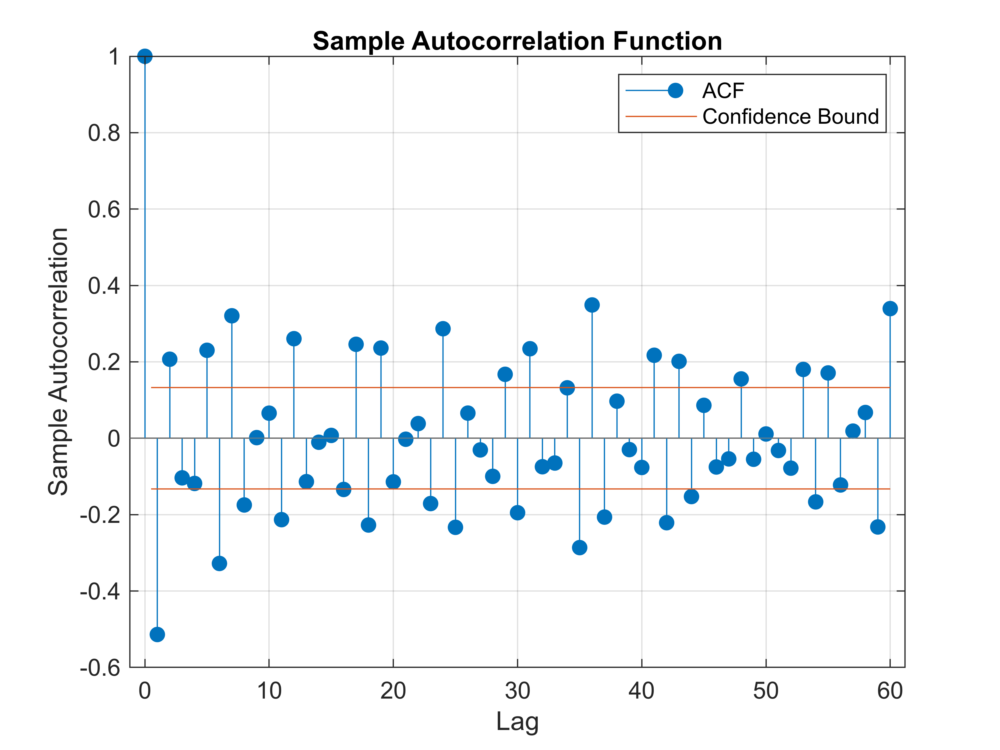

In [37]:
% Plot autocorrelation function
figure
autocorr(non_seasonal_differenced, "NumLags", 60)


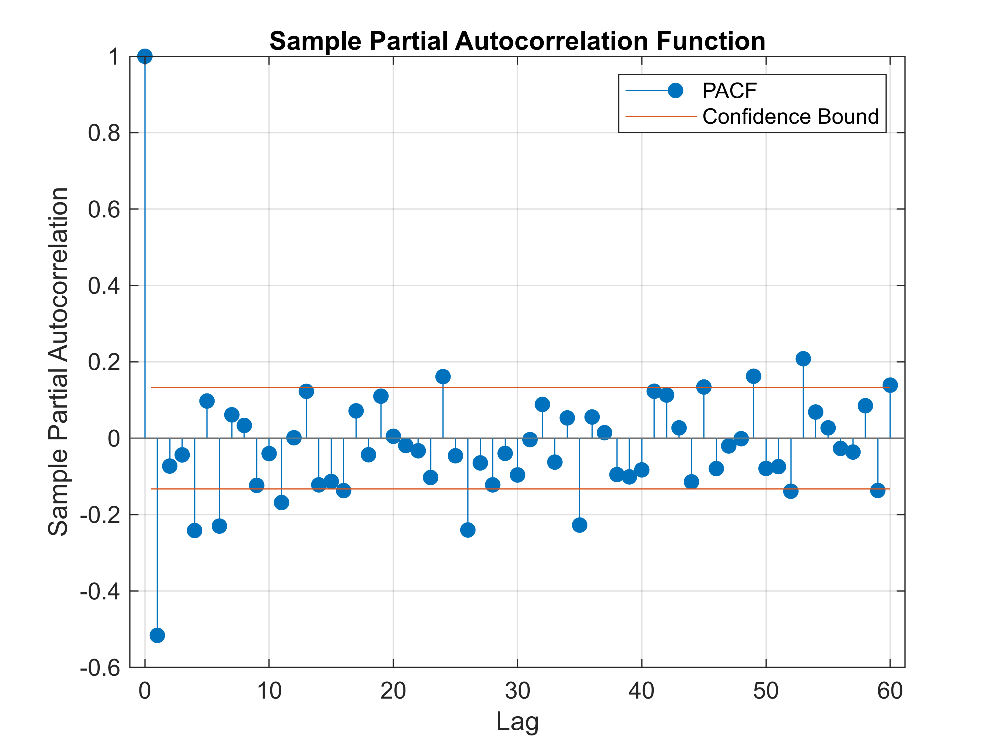

In [38]:
% Plot partial autocorrelation function
figure
parcorr(non_seasonal_differenced, "NumLags", 60)


The significant negative spikes at lag 1 in both the ACF and PACF suggest that both AR(1) and MA(1) terms should be considered in the initial model specification. The presence of several other significant spikes in the ACF indicates that a higher\-order MA component might be needed.

#### Model Selection and Training

To keep it simple, a starter **ARIMA(1,1,1)** model will be used as a reference, and I will gradually increase its complexity.


In [39]:
% Establish reference ARIMA(1,1,1) model
starter = struct();
starter.mdl = arima("Constant", 0, "ARLags", 1, "D", 1, "MALags", 1);
starter.est = estimate(starter.mdl, remaining_series);

 
    ARIMA(1,1,1) Model (Gaussian Distribution):
 
                  Value      StandardError    TStatistic      PValue  
                _________    _____________    __________    __________
    Constant            0              0           NaN             NaN
    AR{1}        -0.34063        0.12278       -2.7742       0.0055339
    MA{1}        -0.23539        0.11577       -2.0333        0.042019
    Variance    0.0042626     0.00035099        12.144      6.1426e-34

In [40]:
% Stater model summary stats
starter.summary = summarize(starter.est);
disp(starter.summary)

               Description: "ARIMA(1,1,1) Model (Gaussian Distribution)"
                SampleSize: 228
    NumEstimatedParameters: 3
             LogLikelihood: 298.68
                       AIC: -591.36
                       BIC: -581.07
                     Table: [4x4 table]
             VarianceTable: [1x4 table]


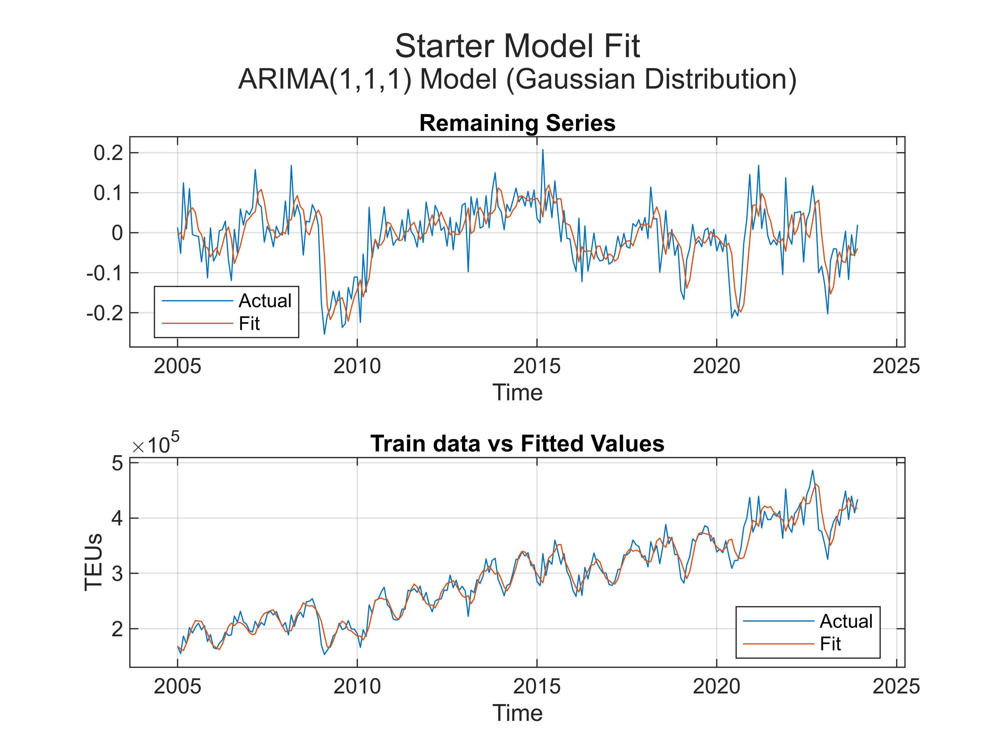

In [41]:
% Create table for reference model fit
starter.fit = table();
starter.fit.Time = remaining_series.Time;
starter.fit.residuals = infer(starter.est, remaining_series.remainder); % compute models residuals
starter.fit.y_hat = remaining_series.remainder - starter.fit.residuals; % compute models fit
starter.fit.sum = (starter.fit.y_hat) + feval(long_term_mdl, 1:prev_idx) + feval(seasonal_mdl, 1:prev_idx); % sum of series components
starter.fit.TEUs = exp(starter.fit.sum); % reverse log-transformation

% Visualize the fitted values
figure
t = tiledlayout;
title(t, "Starter Model Fit", "FontSize", 14)
subtitle(t, starter.mdl.Description)

% Remaining series
nexttile
plot(remaining_series, "Time", "remainder")
hold on
plot(starter.fit, "Time", "y_hat")
title("Remaining Series")
axis padded; grid on
legend("Actual", "Fit", "Location", "best")

% Train data vs fitted reference model
nexttile
plot(train_data, "Time", "TEUs")
hold ON
plot(starter.fit, "Time", "TEUs")
title("Train data vs Fitted Values")
grid on; axis padded
legend("Actual", "Fit", "Location", "best")


Let's now compute some metrics to verify how good the model perfoms on the train data set.


In [42]:
starter.fit_metrics = computeMetrics(starter.fit.TEUs, train_data.TEUs);
disp(starter.fit_metrics)

       MSE         MAE     RMSE      MAPE      RRSE  
    __________    _____    _____    ______    _______
    4.0931e+08    14897    20231    5.0746    0.26469


The <samp>MAPE = 5.07%</samp> suggests good relative accuracy, and the <samp>RRSE = 0.26</samp> indicates the model performs significantly better than a naive predictor. Additionally, the <samp>RMSE = 20,231</samp> provides a meaningful measure of the absolute error, expressed in the same units as the original data.


Given the clear seasonal patterns observed in the ACF and PACF plots—highlighted by significant recurring spikes—it is appropriate to proceed with a **seasonal ARIMA (SARIMA)** model to better capture this structure.


In [43]:
sarimaSpike = struct();
sarimaSpike.mdl = arima("Constant", 0, "ARLags", 1, "D", 1, "MALags", 1:2, "SARLags", [6 7], "Seasonality", 0, "SMALags", [12 24 36 48]);
% sarimaSpike.mdl = arima("Constant", 0, "ARLags", 1:3, "D", 1, "MALags", 1:3, "SARLags", [12 24 36], "Seasonality", 12, "SMALags", [12 24 36 48 60]);
sarimaSpike.est = estimate(sarimaSpike.mdl, remaining_series);

 
    ARIMA(1,1,2) Model with Seasonal AR(7) and MA(48) (Gaussian Distribution):
 
                  Value      StandardError    TStatistic      PValue  
                _________    _____________    __________    __________
    Constant            0              0            NaN            NaN
    AR{1}        -0.67828        0.36217        -1.8728       0.061096
    SAR{6}       -0.21959       0.076569        -2.8679      0.0041319
    SAR{7}        0.19671       0.069697         2.8224      0.0047669
    MA{1}         0.19795        0.37132        0.53311        0.59396
    MA{2}        -0.17602        0.21468       -0.81988        0.41228
    SMA{12}       0.08945       0.069521         1.2867        0.19821
    SMA{24}      0.055051       0.070645        0.77927        0.43582
    SMA{36}       0.24692       0.086886         2.8419      0.0044842
    SMA{48}      0.059207       0.091957        0.64386        0.51967
    Variance    0.0035844     0.00028742         12.471     1.074

In [44]:
% Stater model summary stats
sarimaSpike.summary = summarize(sarimaSpike.est);
disp(sarimaSpike.summary)

               Description: "ARIMA(1,1,2) Model with Seasonal AR(7) and MA(48) (Gaussian Distribution)"
                SampleSize: 228
    NumEstimatedParameters: 10
             LogLikelihood: 318.43
                       AIC: -616.87
                       BIC: -582.57
                     Table: [11x4 table]
             VarianceTable: [1x4 table]


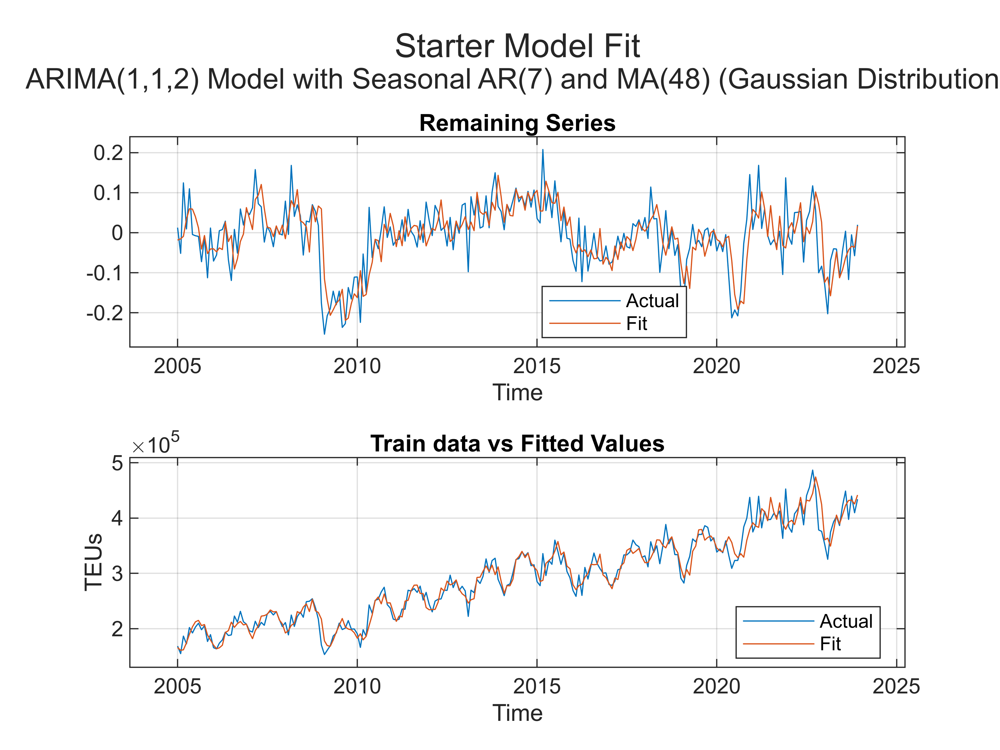

In [45]:

% Create table for reference model fit
sarimaSpike.fit = table();
sarimaSpike.fit.Time = remaining_series.Time;
sarimaSpike.fit.residuals = infer(sarimaSpike.est, remaining_series.remainder); % compute models residuals
sarimaSpike.fit.y_hat = remaining_series.remainder - sarimaSpike.fit.residuals; % compute models fit
sarimaSpike.fit.sum = (sarimaSpike.fit.y_hat) + feval(long_term_mdl, 1:prev_idx) + feval(seasonal_mdl, 1:prev_idx); % sum of series components
sarimaSpike.fit.TEUs = exp(sarimaSpike.fit.sum); % reverse log-transformation

% Visualize the fitted values
figure
t = tiledlayout;
title(t, "Starter Model Fit", "FontSize", 14)
subtitle(t, sarimaSpike.mdl.Description)

% Remaining series
nexttile
plot(remaining_series, "Time", "remainder")
hold on
plot(sarimaSpike.fit, "Time", "y_hat")
title("Remaining Series")
axis padded; grid on
legend("Actual", "Fit", "Location", "best")

% Train data vs fitted reference model
nexttile
plot(train_data, "Time", "TEUs")
hold ON
plot(sarimaSpike.fit, "Time", "TEUs")
title("Train data vs Fitted Values")
grid on; axis padded
legend("Actual", "Fit", "Location", "best")

In [46]:
sarimaSpike.fit_metrics = computeMetrics(sarimaSpike.fit.TEUs, train_data.TEUs);
disp(sarimaSpike.fit_metrics)

       MSE         MAE     RMSE      MAPE      RRSE 
    __________    _____    _____    ______    ______
    3.4383e+08    13214    18543    4.5204    0.2426

In [47]:
% Forecast indexes
frcst_idx = (prev_idx+1:prev_idx + height(test_data))';

% Forecast horizon
frcst_horizon = height(frcst_idx)

frcst_horizon = 
    14

In [48]:
% Evaluate these models at the specified indices in frcst.Idx
long_term_frcst = feval(long_term_mdl, frcst_idx);
seasonal_frcst = feval(seasonal_mdl, frcst_idx);


We will now forecast the remaining time series with the starter  ARIMA model.


In [49]:
sarimaSpike.frcst = table();
sarimaSpike.frcst.Time = test_data.Time;
[sarimaSpike.frcst.frcst, sarimaSpike.frcst.residuals] = forecast(sarimaSpike.est, frcst_horizon, remaining_series.remainder);


To create the final forecast, we add the individual results from each model component: the long\-term, seasonal, and ARIMA models. This approach combines all aspects of the time series data for a complete prediction.


In [50]:
sarimaSpike.frcst.sum = long_term_frcst + seasonal_frcst + sarimaSpike.frcst.frcst;


To make our forecast interpretable, we need to reverse the initial transformation. We used a logarithmic function to stabilize the data, and now we'll apply the exponential function to return the data to its original scale. This ensures our forecasted values match the units of the observed data, making the forecasts accurate and useful for decision\-making


In [51]:
sarimaSpike.frcst.TEUs = exp(sarimaSpike.frcst.sum)

sarimaSpike = struct with fields:
            mdl: [1x1 arima]
            est: [1x1 arima]
        summary: [1x1 struct]
            fit: [228x5 table]
    fit_metrics: [1x5 table]
          frcst: [14x5 table]


Here, we plot the actual TEUs data from the test period alongside our forecasted values. This visual representation allows us to see the performance of reference our models at a glance, making it easier to communicate the results and draw meaningful conclusions.



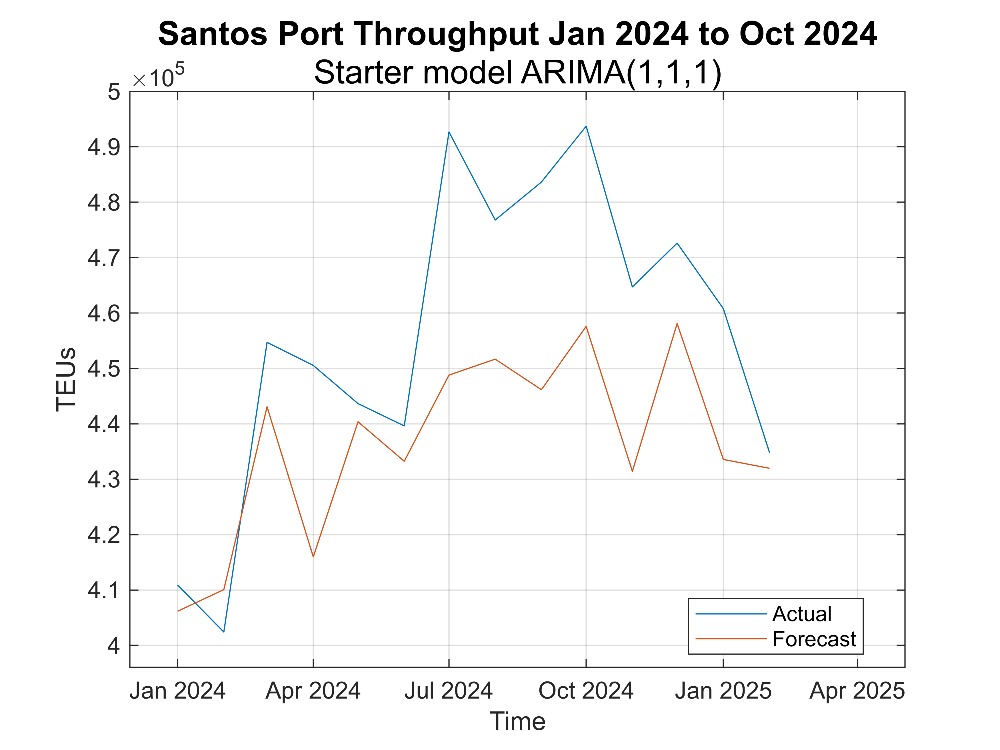

In [52]:
test_data.TEUs = exp(test_data.log_TEUs);
train_data.TEUs = exp(train_data.log_TEUs);
figure
plot(test_data, "Time", "TEUs")
hold on
plot(sarimaSpike.frcst, "Time", "TEUs")
title("Santos Port Throughput Jan 2024 to Oct 2024", "Starter model ARIMA(1,1,1)", "FontSize", 14)
ylabel("TEUs"); grid on; axis padded
legend("Actual", "Forecast", "Location", "best")


We will use RMSE and RRSE for model comparison and benchmarking. These metrics help evaluate our forecasting models and provide insights for improving them in the future.


In [53]:
disp(sarimaSpike.fit_metrics)

       MSE         MAE     RMSE      MAPE      RRSE 
    __________    _____    _____    ______    ______
    3.4383e+08    13214    18543    4.5204    0.2426

In [54]:
sarimaSpike.frcst_metrics = computeMetrics(sarimaSpike.frcst.TEUs, test_data.TEUs);
disp(sarimaSpike.frcst_metrics)

       MSE         MAE     RMSE      MAPE      RRSE  
    __________    _____    _____    ______    _______
    6.2838e+08    20622    25068    4.3935    0.93113


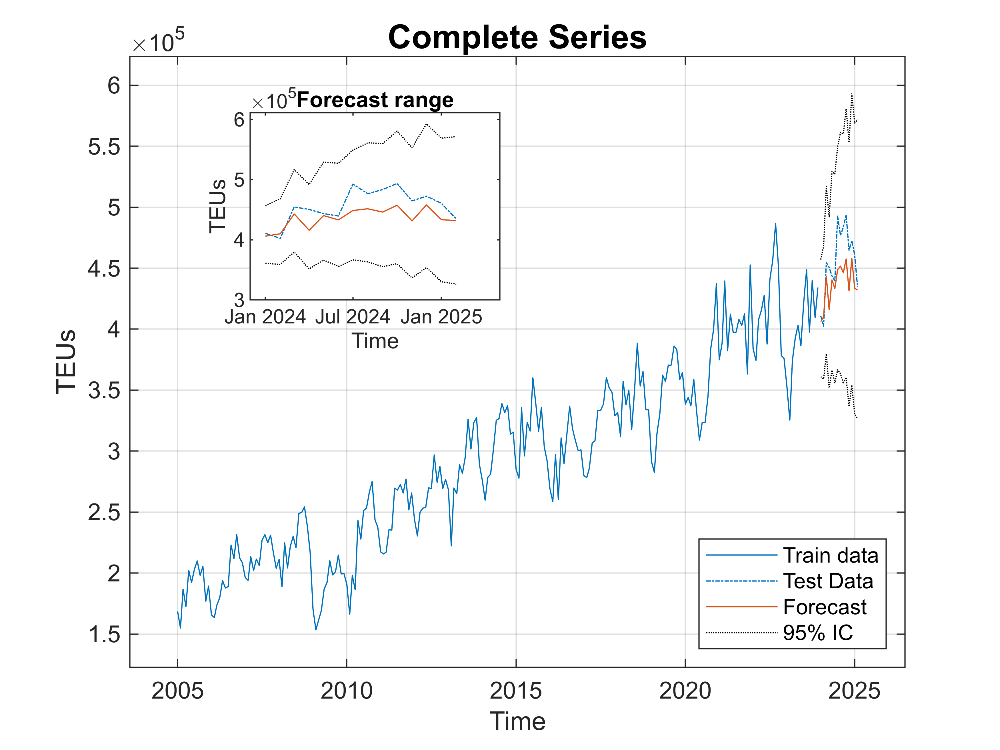

In [55]:
Z = 1.96;

[sarimaSpike.frcst.lower_ci, sarimaSpike.frcst.upper_ci] = computeCI(sarimaSpike.frcst, long_term_mdl, seasonal_mdl, frcst_idx, Z);

figure
plot(train_data,"Time","TEUs")
title("Complete Series","FontSize",14)
axis padded
hold on
plot(test_data,"Time","TEUs","Color","#0072BD","LineStyle","-.");
plot(sarimaSpike.frcst, "Time","TEUs","Color","#D95319")
plot(sarimaSpike.frcst,"Time","lower_ci","Color","k","LineStyle",":")
plot(sarimaSpike.frcst,"Time","upper_ci","Color","k","LineStyle",":")
legend(["Train data","Test Data","Forecast","95% IC"],"Location","southeast")
ylabel("TEUs"); grid on

% Create inset axes
inset_pos = [0.25 0.6 0.25 0.25];
axes('Position', inset_pos)
plot(test_data,"Time","TEUs","LineStyle","-.");
title("Forecast range")
hold on
plot(sarimaSpike.frcst, "Time","TEUs")
plot(sarimaSpike.frcst,"Time","lower_ci","Color","k","LineStyle",":")
plot(sarimaSpike.frcst,"Time","upper_ci","Color","k","LineStyle",":")
ylabel("TEUs"); axis padded

In [56]:
D1 = LagOp({1 -1}, 'Lags', [0,1]);
D12 = LagOp({1 -1}, 'Lags', [0,12]);
D = D1 * D12

D = 
    1-D Lag Operator Polynomial:
    -----------------------------
        Coefficients: [1 -1 -1 1]
                Lags: [0 1 12 13]
              Degree: 13
           Dimension: 1

In [57]:
diff_remaining_series = filter(D, remaining_series.remainder);

% Calculate the loss of observations compared to the original remaining
% series
t = length(remaining_series.remainder) - length(diff_remaining_series)

t = 
    13


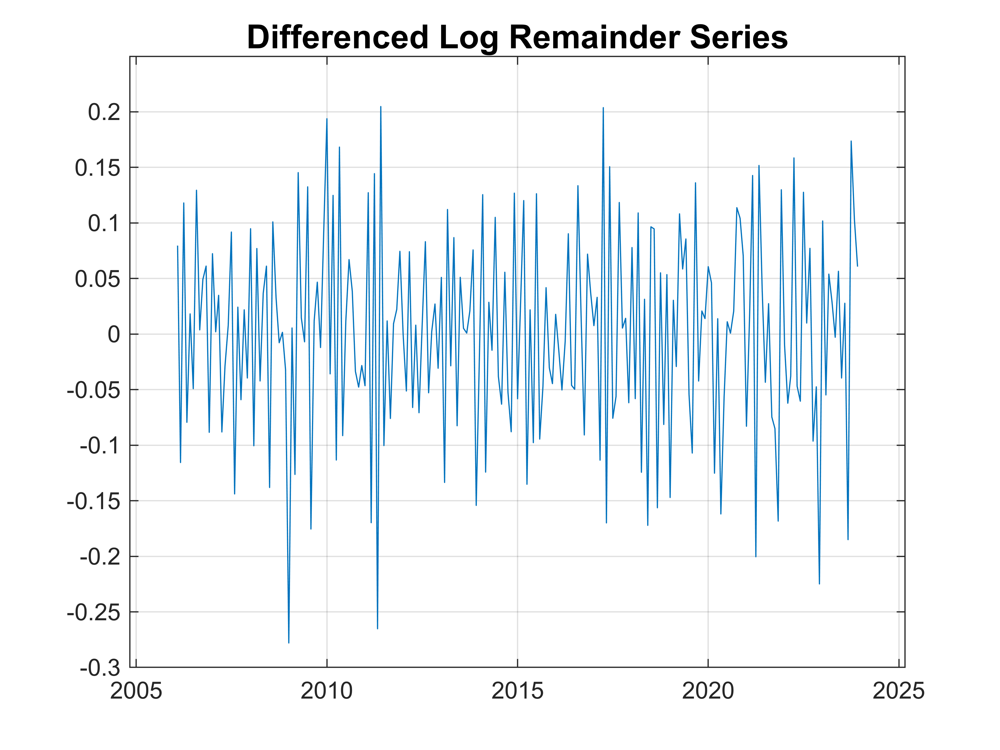

In [58]:
figure
plot(remaining_series.Time(t+1:end), diff_remaining_series)
title('Differenced Log Remainder Series','FontSize',14)
axis padded; grid on

In [59]:
disp(kpsstest(diff_remaining_series, "Trend", false))

   0

In [60]:
disp(adftest(diff_remaining_series))

   1


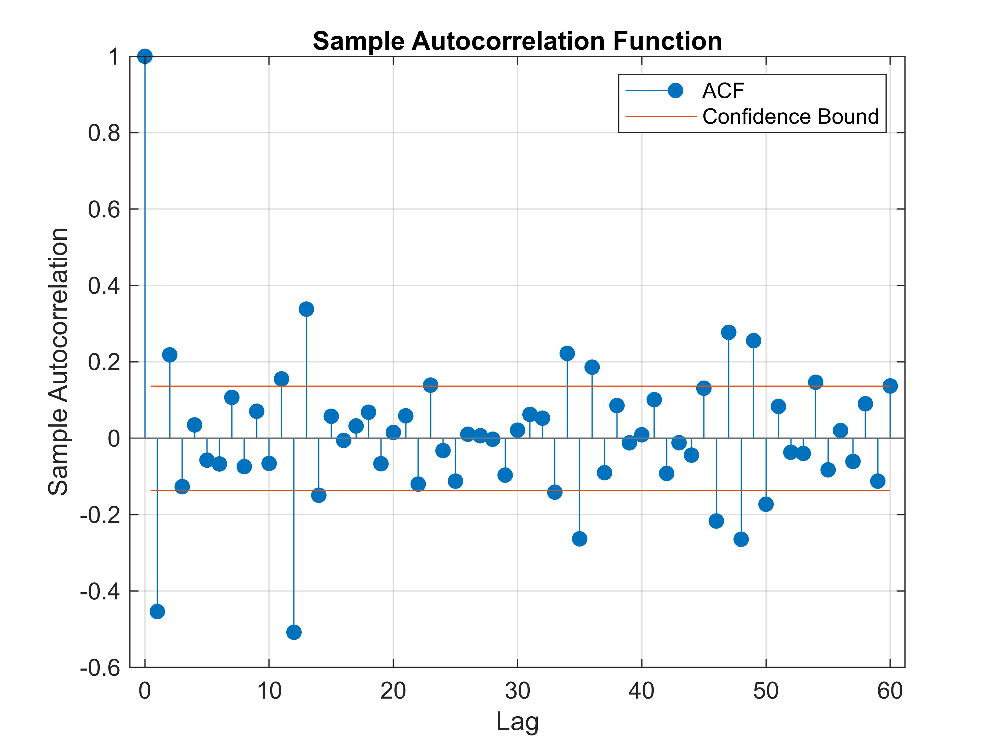

In [61]:
figure
autocorr(diff_remaining_series, "NumLags", 60)


The ACF displays a sharp decline after lag 1, followed by oscillations within or near the confidence bounds over the next four lags, indicating short\-term correlation consistent with an MA(1) process. Additionally, significant spikes at lags that are multiples of 6 are observed, suggesting potential seasonal patterns. To further analyze these characteristics, we will explore SARIMA models.



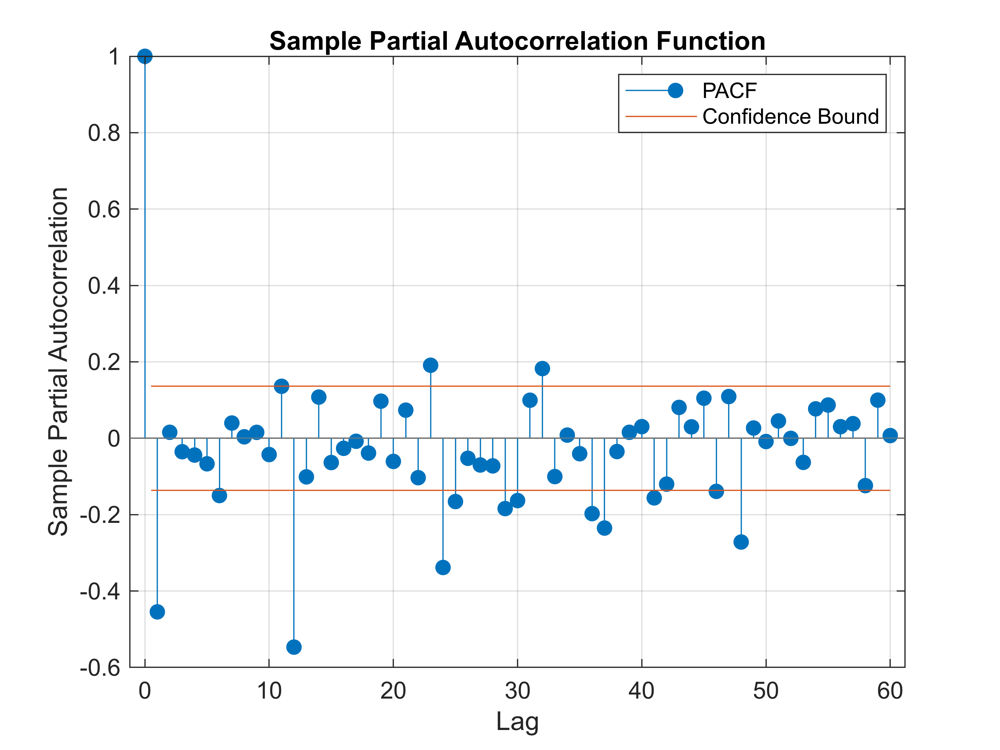

In [62]:
figure
parcorr(diff_remaining_series, "NumLags", 60)


The PACF also shows a sharp drop after lag 1, with subsequent lags staying within or next to the confidence bounds, indicating an AR(1) process.



After that, let's fit the model and visualize how it is adjusted to the series.



As a reference, let's compute some metrics in order to measure the model's fit


In [63]:
starter.fit_metrics = table();
starter.fit_metrics = computeMetrics(starter.fit.TEUs, train_data.TEUs);
disp(starter.fit_metrics)

       MSE         MAE     RMSE      MAPE      RRSE  
    __________    _____    _____    ______    _______
    4.0931e+08    14897    20231    5.0746    0.26469


Based on the ACF and PACF plots, it suggestive to train a model wilth multiple seasonal lags: PACF shows spikes on lags 1, 12 and 24, while ACF does the same in lags 1, 12 and 13. So let's train a model based on this information


First, let's create this table with time stamps and indices. Since the models use indices instead of actual time stamps, I need to generate indices to match the training data. These indices are based on the length of our training data. I'll also define <samp>frcstHorizon</samp>, which sets how many time steps ahead the model will predict.


In [64]:
% Forecast indexes
frcst_idx = (prev_idx+1:prev_idx + height(test_data))';

% Forecast horizon
frcst_horizon = height(frcst_idx)

frcst_horizon = 
    14

In [65]:
% Evaluate these models at the specified indices in frcst.Idx
long_term_frcst = feval(long_term_mdl, frcst_idx);
seasonal_frcst = feval(seasonal_mdl, frcst_idx);


We will now forecast the remaining time series with the starter  ARIMA model.


In [66]:
starter.frcst = table();
starter.frcst.Time = test_data.Time;
[starter.frcst.frcst, starter.frcst.residuals] = forecast(starter.est, frcst_horizon, remaining_series.remainder);


To create the final forecast, we add the individual results from each model component: the long\-term, seasonal, and ARIMA models. This approach combines all aspects of the time series data for a complete prediction.


In [67]:
starter.frcst.sum = long_term_frcst + seasonal_frcst + starter.frcst.frcst;


To make our forecast interpretable, we need to reverse the initial transformation. We used a logarithmic function to stabilize the data, and now we'll apply the exponential function to return the data to its original scale. This ensures our forecasted values match the units of the observed data, making the forecasts accurate and useful for decision\-making


In [68]:
starter.frcst.TEUs = exp(starter.frcst.sum)

starter = struct with fields:
            mdl: [1x1 arima]
            est: [1x1 arima]
        summary: [1x1 struct]
            fit: [228x5 table]
    fit_metrics: [1x5 table]
          frcst: [14x5 table]


Here, we plot the actual TEUs data from the test period alongside our forecasted values. This visual representation allows us to see the performance of reference our models at a glance, making it easier to communicate the results and draw meaningful conclusions.




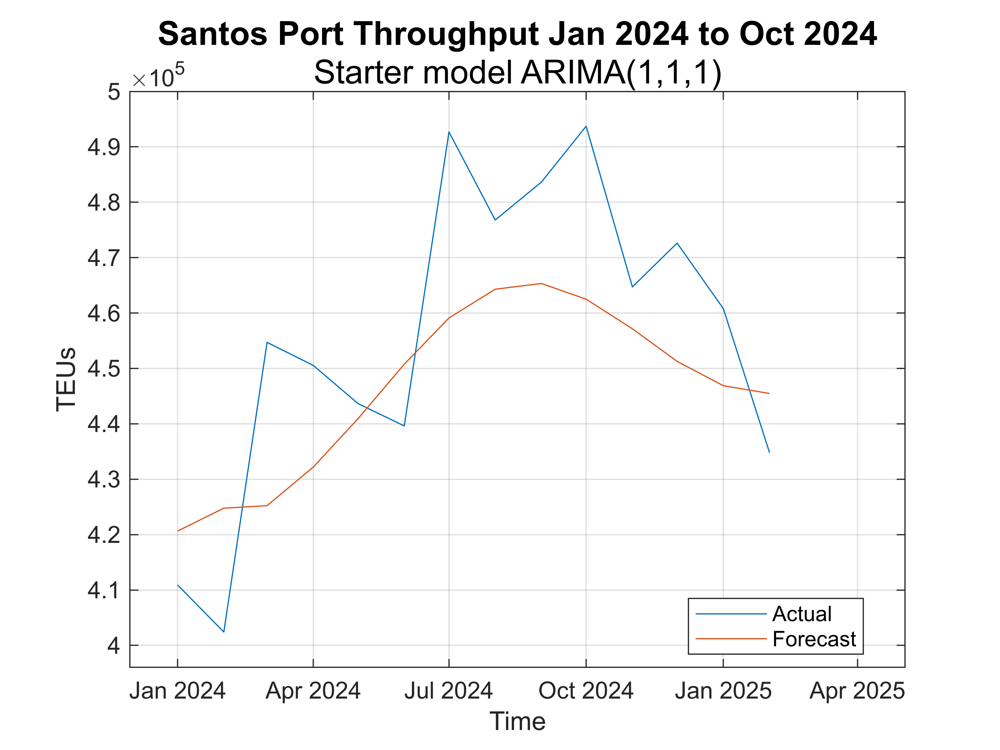

In [69]:
test_data.TEUs = exp(test_data.log_TEUs);
train_data.TEUs = exp(train_data.log_TEUs);
figure
plot(test_data, "Time", "TEUs")
hold on
plot(starter.frcst, "Time", "TEUs")
title("Santos Port Throughput Jan 2024 to Oct 2024", "Starter model ARIMA(1,1,1)", "FontSize", 14)
ylabel("TEUs"); grid on; axis padded
legend("Actual", "Forecast", "Location", "best")


We will use RMSE and RRSE for model comparison and benchmarking. These metrics help evaluate our forecasting models and provide insights for improving them in the future.


In [70]:
% Create Metrics Table
starter.metrics = table();

% Calculate the metrics
starter.fit_metrics = computeMetrics(starter.fit.TEUs,train_data.TEUs);
disp(starter.fit_metrics)

       MSE         MAE     RMSE      MAPE      RRSE  
    __________    _____    _____    ______    _______
    4.0931e+08    14897    20231    5.0746    0.26469

In [71]:
starter.frcst_metrics = computeMetrics(starter.frcst.TEUs,test_data.TEUs);
disp(starter.frcst_metrics)

       MSE         MAE     RMSE      MAPE      RRSE  
    __________    _____    _____    ______    _______
    3.8187e+08    17349    19542    3.7708    0.72587


The RMSE (19,542) and RRSE (0.72587) help evaluate the performance of our starter forecasting model. The RMSE shows that, on average, the forecasted throughput differs from actual values by about 20K TEUs, giving us an idea of the prediction error in the same units as the data. The RRSE, being less than 1, indicates that our model performs better than a simple mean predictor.


Now let's compute and plot the forecast with its confidente interval.



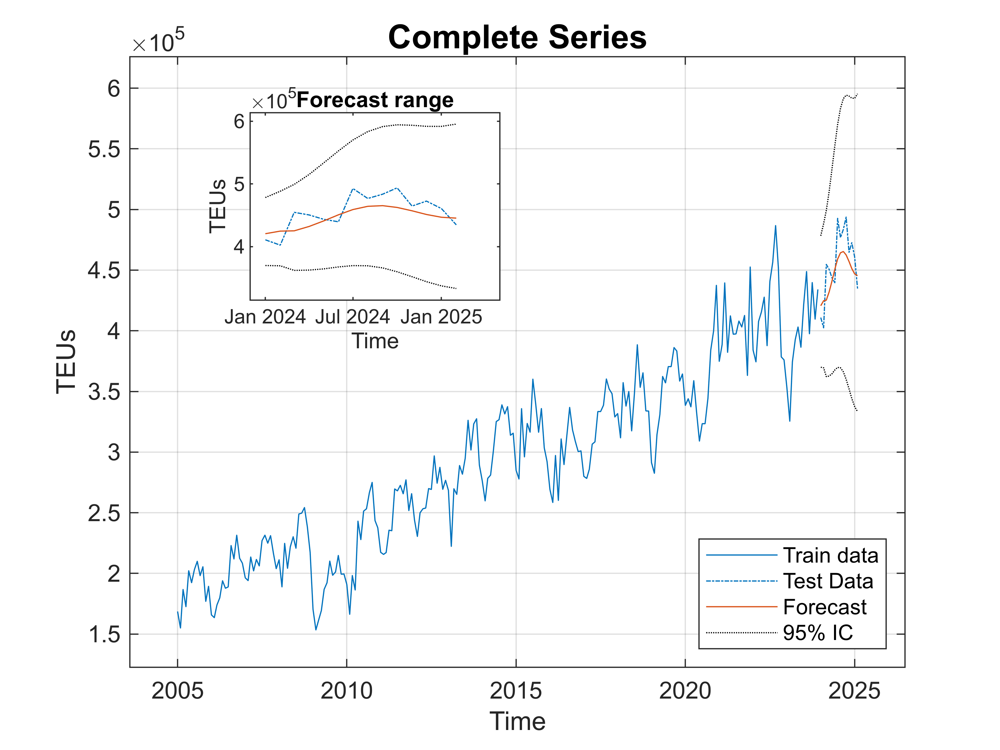

In [72]:
Z = 1.96;

[starter.frcst.lower_ci, starter.frcst.upper_ci] = computeCI(starter.frcst, long_term_mdl, seasonal_mdl, frcst_idx, Z);

figure
plot(train_data,"Time","TEUs")
title("Complete Series","FontSize",14)
axis padded
hold on
plot(test_data,"Time","TEUs","Color","#0072BD","LineStyle","-.");
plot(starter.frcst, "Time","TEUs","Color","#D95319")
plot(starter.frcst,"Time","lower_ci","Color","k","LineStyle",":")
plot(starter.frcst,"Time","upper_ci","Color","k","LineStyle",":")
legend(["Train data","Test Data","Forecast","95% IC"],"Location","southeast")
ylabel("TEUs"); grid on

% Create inset axes
inset_pos = [0.25 0.6 0.25 0.25];
axes('Position', inset_pos)
plot(test_data,"Time","TEUs","LineStyle","-.");
title("Forecast range")
hold on
plot(starter.frcst, "Time","TEUs")
plot(starter.frcst,"Time","lower_ci","Color","k","LineStyle",":")
plot(starter.frcst,"Time","upper_ci","Color","k","LineStyle",":")
ylabel("TEUs"); axis padded


Now, let's incrementally increase the AR and MA terms and evaluate their performance using the Akaike Information Criterion (AIC) and Bayesian Information Criterion (BIC). These metrics strike a balance between model fit and complexity, with lower values indicating better models while penalizing excessive parameters.



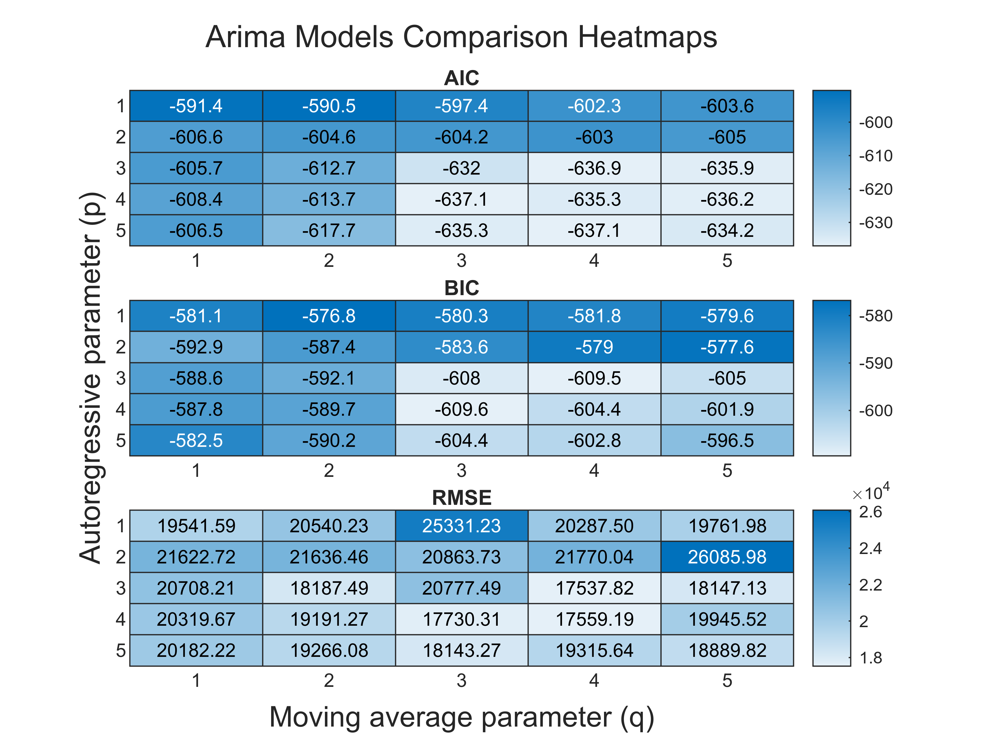

In [73]:
% Pre=allocate AIC and BIC matrices
AIC = nan(5,5);
BIC = nan(5,5);
RMSE = nan(5,5);

% Loop through the ARIMA model parameters p and q
for p = 1:5
    for q = 1:5
        % Define ARIMA model with order (p,1,q)
        mdl = arima("Constant", 0, "ARLags", 1:p, "D", 1, "MALags", 1:q, "Distribution", "Gaussian");

        % Estimate model parameters using the remaining time series data
        EstMdl = estimate(mdl, remaining_series, "Display", "off");

        % Capture the model information
        summary = summarize(EstMdl);

        % Compute AIC and BIC metrics
        AIC(p,q) = summary.AIC;
        BIC(p,q) = summary.BIC;

        % Forecast the future values
        mdl_frcst = forecast(EstMdl, frcst_horizon, remaining_series.remainder);

        % Combine forecasts
        comb_frcst = long_term_frcst + seasonal_frcst + mdl_frcst;

        % Calculate forecasted TEUs
        TEUs_frcst = exp(comb_frcst);

        % Calculate RMSE between forecasted and actual values
        RMSE(p,q) = rmse(TEUs_frcst, test_data.TEUs);
    end
end

% Create tiled layout
figure;
t = tiledlayout(3,1);
sgtitle('Arima Models Comparison Heatmaps');
t.TileSpacing = "tight";
xlabel(t,"Moving average parameter (q)"); ylabel(t,"Autoregressive parameter (p)")

% AIC Heatmap
nexttile
heatmap(AIC);
title('AIC');

% BIC Heatmap
nexttile
heatmap(BIC);
title('BIC');

% RMSE Heatmap
nexttile
heatmap(RMSE, CellLabelFormat='%.2f');
title('RMSE');

In [74]:
% Find index of min AIC and BIC
[minAICp,minAICq] = find(min(AIC,[],'all') == AIC);
[minBICp,minBICq] = find(min(BIC,[],'all') == BIC);
[minRMSEp,minRMSEq] = find(min(RMSE,[],'all') == RMSE);

% Create row names
rowNames = {
    sprintf('Best AIC:  ARIMA(%-d,1,%d)', minAICp, minAICq)
    sprintf('Best BIC:  ARIMA(%d,1,%d)', minBICp, minBICq)
    sprintf('Best RMSE:  ARIMA(%d,1,%d)', minRMSEp, minRMSEq)
    };

% Collect the best values for AIC and BIC
metrics = [
    AIC(minAICp,minAICq), BIC(minAICp,minAICq), RMSE(minAICp,minAICq);
    AIC(minBICp,minBICq), BIC(minBICp,minBICq), RMSE(minBICp,minBICq);
    AIC(minRMSEp,minRMSEq), BIC(minRMSEp,minRMSEq), RMSE(minRMSEp,minRMSEq);
    ];

% Create the table
metricsTable = array2table(metrics, 'VariableNames', {'AIC', 'BIC', 'RMSE'}, 'RowNames', rowNames);
disp(metricsTable);

                                  AIC        BIC      RMSE 
                                _______    _______    _____
    Best AIC:  ARIMA(5,1,4)      -637.1     -602.8    19316
    Best BIC:  ARIMA(4,1,3)     -637.06    -609.62    17730
    Best RMSE:  ARIMA(3,1,4)    -636.93     -609.5    17538


While ARIMA(2,1,1) yields the lowest AIC and BIC, indicating a better balance between model fit and complexity, ARIMA(3,1,1) demonstrates the strongest predictive performance, with the lowest RMSE. Although ARIMA(3,1,2) has slightly higher AIC and BIC values due to the additional parameter, the reduction in RMSE (from 22,011 to 17,170) represents an improvement of approximately 22%, which justifies the added complexity. Given this trade\-off, ARIMA(3,1,1) is selected for its superior forecasting accuracy.


Compared to the baseline ARIMA(1,1,1), the extended model show improved performance of


In [75]:
% Define ARIMA(3,1,2)
optimal_arima = struct();
optimal_arima.mdl = arima("Constant", 0, "ARLags", 1:3, "D", 1, "MALags", 1:4,'Distribution','Gaussian');
optimal_arima.y = estimate(optimal_arima.mdl, remaining_series, "Display", "off");
optimal_arima.summary = summarize(optimal_arima.y);

% Create table for reference results
optimal_arima.fit = table();
optimal_arima.fit = table();
optimal_arima.fit.Time = remaining_series.Time;
optimal_arima.fit.residuals = infer(optimal_arima.y, remaining_series.remainder);
optimal_arima.fit.y_hat = remaining_series.remainder - optimal_arima.fit.residuals;

% Optimal ARIMA forecast
optimal_arima.frcst = table();
optimal_arima.frcst.Time = test_data.Time;
[optimal_arima.frcst.frcst, optimal_arima.frcst.residuals] = forecast(optimal_arima.y, frcst_horizon, remaining_series.remainder);
optimal_arima.frcst.sum = long_term_frcst + seasonal_frcst + optimal_arima.frcst.frcst;
optimal_arima.frcst.TEUs = exp(optimal_arima.frcst.sum);

% Calculate Optimal ARIMA metrics
optimal_arima.metrics = table();
optimal_arima.metrics.MSE = mse(optimal_arima.frcst.TEUs, test_data.TEUs);
optimal_arima.metrics.RMSE = rmse(optimal_arima.frcst.TEUs,test_data.TEUs);
optimal_arima.metrics.MAPE = mape(optimal_arima.frcst.TEUs,test_data.TEUs);
optimal_arima.metrics.RRSE = sqrt(sum((optimal_arima.frcst.TEUs - test_data.TEUs).^2) / sum((test_data.TEUs - mean(test_data.TEUs)).^2));
disp(optimal_arima.metrics)

       MSE        RMSE      MAPE      RRSE  
    __________    _____    ______    _______
    3.0758e+08    17538    3.5338    0.65144

In [76]:
disp(optimal_arima.summary)

               Description: "ARIMA(3,1,4) Model (Gaussian Distribution)"
                SampleSize: 228
    NumEstimatedParameters: 8
             LogLikelihood: 326.47
                       AIC: -636.93
                       BIC: -609.5
                     Table: [9x4 table]
             VarianceTable: [1x4 table]


Next, I will extend the analysis to seasonal ARIMA (SARIMA) models by keeping the non\-seasonal parameters fixed and testing different seasonal components.


A seasonality of 12 is the most obvious choice as the data follows an annual pattern, making it a natural starting point for SARIMA model testing.



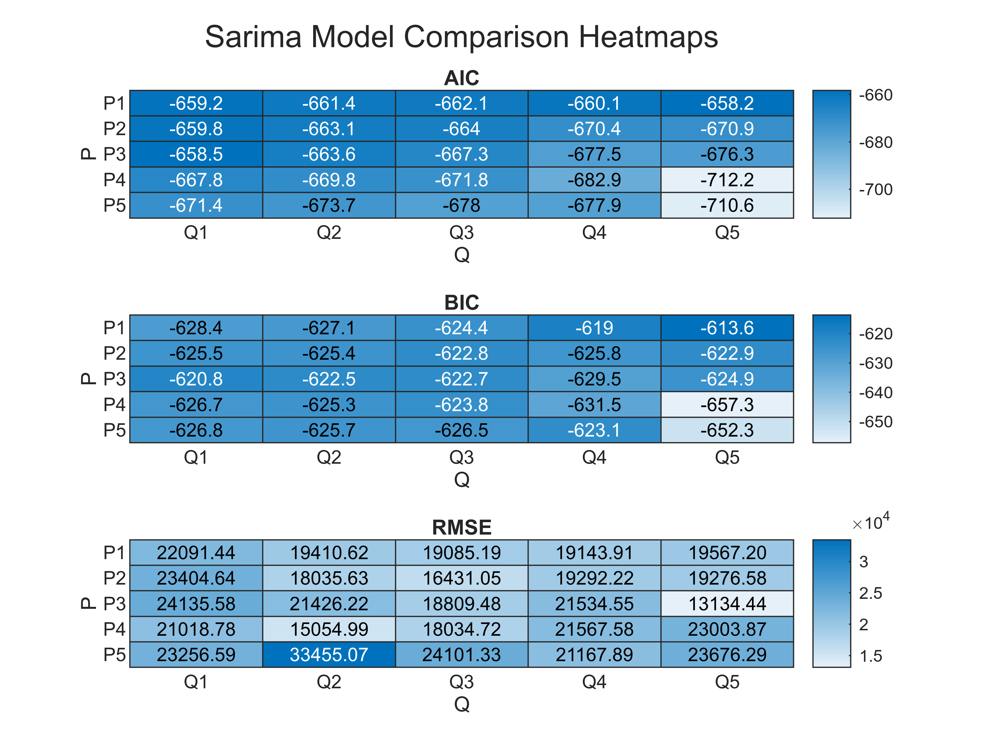

In [77]:
% Define seasonal parameters
SARLags = 12:12:60;
SMALags = 12:12:60;

% Initialize selection metrics
AIC = nan(5,5);
BIC = nan(5,5);
RMSE = nan(5,5);

for P = 1:5
    for Q = 1:5
        mdl = arima('Constant',0,'ARLags',1:3,'D',1,'MALags',1:3,'SARLags',SARLags(1:P),'Seasonality',12,'SMALags',SMALags(1:Q),'Distribution','Gaussian');

        % Estimate model parameters using the remaining time series data
        EstMdl = estimate(mdl, remaining_series, "Display", "off");

        % Capture the model information
        info = summarize(EstMdl);

        % Compute AIC and BIC metrics
        AIC(P,Q) = info.AIC;
        BIC(P,Q) = info.BIC;

        % Forecast the future values
        mdlFrcst = forecast(EstMdl, frcst_horizon, remaining_series.remainder);

        % Combine forecasts
        combFrcst = long_term_frcst + seasonal_frcst + mdlFrcst;

        % Calculate forecasted TEUs
        TEUsForecast = exp(combFrcst);

        % Calculate RMSE between forecasted and actual values
        RMSE(P,Q) = rmse(TEUsForecast, test_data.TEUs);
    end
end

% Axis tick labels
p_values = ["P1", "P2", "P3", "P4", "P5"];
q_values = ["Q1", "Q2", "Q3", "Q4", "Q5"];

% Create tiled layout
figure;
tiledlayout(3,1);
sgtitle('Sarima Model Comparison Heatmaps');

% AIC Heatmap
nexttile
heatmap(q_values, p_values, AIC);
title('AIC');
xlabel('Q'); ylabel('P');

% BIC Heatmap
nexttile
heatmap(q_values, p_values, BIC);
title('BIC');
xlabel('Q'); ylabel('P');

% RMSE Heatmap
nexttile
heatmap(q_values, p_values, RMSE, CellLabelFormat='%.2f');
title('RMSE');
xlabel('Q'); ylabel('P');

In [78]:
% Find index of min AIC and BIC
[minAICP,minAICQ] = find(min(AIC,[],'all') == AIC);
[minBICP,minBICQ] = find(min(BIC,[],'all') == BIC);
[minRMSEP,minRMSEQ] = find(min(RMSE,[],'all') == RMSE);

% Create row names
rowNames = {
    sprintf('Best AIC:  SARIMA(3,1,1)(%d,0,%d)_12', minAICP, minAICQ)
    sprintf('Best BIC:  SARIMA(3,1,1)(%d,0,%d)_12', minBICP, minBICQ)
    sprintf('Best RMSE: SARIMA(3,1,1)(%d,0,%d)_12', minRMSEP, minRMSEQ)
    };

% Collect the best values for AIC, BIC and RMSE
metrics = [
    AIC(minAICP,minAICQ), BIC(minAICP,minAICQ), RMSE(minAICP,minAICQ);
    AIC(minBICP,minBICQ), BIC(minBICP,minBICQ), RMSE(minBICP,minBICQ);
    AIC(minRMSEP,minRMSEQ), BIC(minRMSEP,minRMSEQ), RMSE(minRMSEP,minRMSEQ);
    ];

% Create the table
metricsTable = array2table(metrics, 'VariableNames', {'AIC', 'BIC', 'RMSE'}, 'RowNames', rowNames);
disp(metricsTable);

                                            AIC        BIC      RMSE 
                                          _______    _______    _____
    Best AIC:  SARIMA(3,1,1)(4,0,5)_12    -712.16    -657.29    23004
    Best BIC:  SARIMA(3,1,1)(4,0,5)_12    -712.16    -657.29    23004
    Best RMSE: SARIMA(3,1,1)(3,0,5)_12    -676.34     -624.9    13134


The SARIMA models provided a better fit compared to the non\-seasonal ones. While **SARIMA(2,1,1)(5,0,5)\_12** and  **SARIMA(2,1,1)(4,0,5)\_12** achieve the best AIC and BIC metrics, respectively, **SARIMA(2,1,1)(5,0,3)\_12** offers a significantly lower RMSE without adding excessive complexity. Therefore, I will choose the second model to assess the residuals, and if no issues are found, this model will be selected.


In [79]:
SARIMAMdl = struct();
% SARIMAMdl.mdl = arima('Constant',0,'ARLags',1:3,'D',1,'MALags',1,'SARLags',[12 24 36],'Seasonality',12,'SMALags',[12 24 36 42 60],'Distribution','Gaussian');
SARIMAMdl.mdl = arima('Constant',0,'ARLags',1:3,'D',1,'MALags',1:3,"SARLags",[12 24 36],"Seasonality",12,"SMALags",[12 24 36 48 60],'D',1,'Distribution','Gaussian');
SARIMAMdl.y = estimate(SARIMAMdl.mdl,remaining_series);

 
    ARIMA(3,1,3) Model Seasonally Integrated with Seasonal AR(36) and MA(60) (Gaussian Distribution):
 
                  Value      StandardError    TStatistic      PValue   
                _________    _____________    __________    ___________
    Constant            0              0            NaN             NaN
    AR{1}         0.71411        0.36724         1.9445        0.051835
    AR{2}         0.28861        0.07879          3.663       0.0002493
    AR{3}        -0.18846        0.20249       -0.93069         0.35201
    SAR{12}      -0.86484       0.076116        -11.362      6.4484e-30
    SAR{24}      -0.79183       0.068009        -11.643       2.489e-31
    SAR{36}      -0.78883        0.03428        -23.012     3.5616e-117
    MA{1}         -1.1974        0.38264        -3.1292        0.001753
    MA{2}         0.24402        0.26311        0.92745         0.35369
    MA{3}       -0.046665        0.16723       -0.27904         0.78021
    SMA{12}      -0.11314     

In [80]:
% Create table for reference results
SARIMAMdl.fit = table();
SARIMAMdl.fit.Time = remaining_series.Time;
SARIMAMdl.fit.residuals = infer(SARIMAMdl.y, remaining_series.remainder);
SARIMAMdl.fit.y_hat = remaining_series.remainder - SARIMAMdl.fit.residuals;

% Optimal ARIMA forecast
SARIMAMdl.frcst = table();
SARIMAMdl.frcst.Time = test_data.Time;
[SARIMAMdl.frcst.frcst, SARIMAMdl.frcst.residuals] = forecast(SARIMAMdl.y, frcst_horizon, remaining_series.remainder);
SARIMAMdl.frcst.sum = long_term_frcst + seasonal_frcst + SARIMAMdl.frcst.frcst;
SARIMAMdl.frcst.TEUs = exp(SARIMAMdl.frcst.sum);

% Calculate Optimal ARIMA metrics
SARIMAMdl.metrics = table();
SARIMAMdl.metrics.MSE = mse(SARIMAMdl.frcst.TEUs, test_data.TEUs);
SARIMAMdl.metrics.RMSE = rmse(SARIMAMdl.frcst.TEUs,test_data.TEUs);
SARIMAMdl.metrics.MAPE = mape(SARIMAMdl.frcst.TEUs,test_data.TEUs);
SARIMAMdl.metrics.RRSE = sqrt(sum((SARIMAMdl.frcst.TEUs - test_data.TEUs).^2) / sum((test_data.TEUs - mean(test_data.TEUs)).^2));
disp(SARIMAMdl.metrics)

       MSE        RMSE      MAPE      RRSE  
    __________    _____    ______    _______
1.7251e+08    13134    2.1741    0.48788

In [81]:
% results_reference = summarize(y_reference)
SARIMAMdl.summary = summarize(SARIMAMdl.y);
disp(SARIMAMdl.summary)

               Description: "ARIMA(3,1,3) Model Seasonally Integrated with Seasonal AR(36) and MA(60) (Gaussian Distribution)"
                SampleSize: 228
    NumEstimatedParameters: 15
             LogLikelihood: 353.17
                       AIC: -676.34
                       BIC: -624.9
                     Table: [16x4 table]
             VarianceTable: [1x4 table]


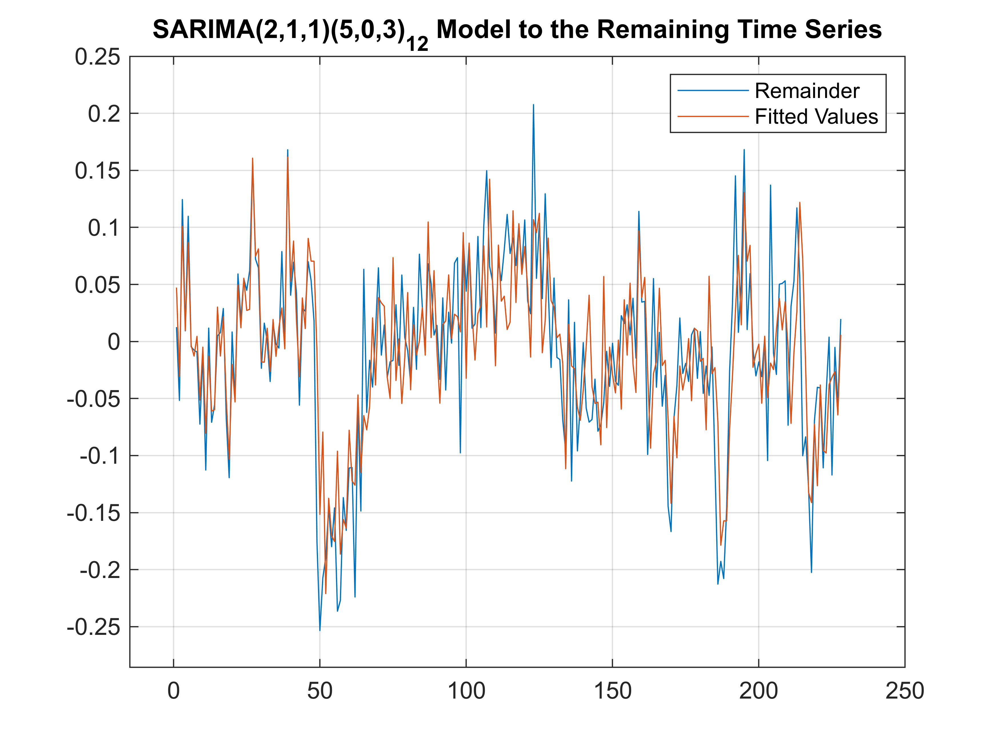

In [82]:
figure
plot(remaining_series.remainder)
hold on
plot(SARIMAMdl.fit.y_hat)
legend(["Remainder","Fitted Values"])
grid on; axis padded
title("SARIMA(2,1,1)(5,0,3)_1_2 Model to the Remaining Time Series")

#### Residuals Analysis

 Ideally, residuals should be randomly distributed with no autocorrelation, indicating that the model has captured all underlying structures in the data. Let's analyse it visually and then apply tests for



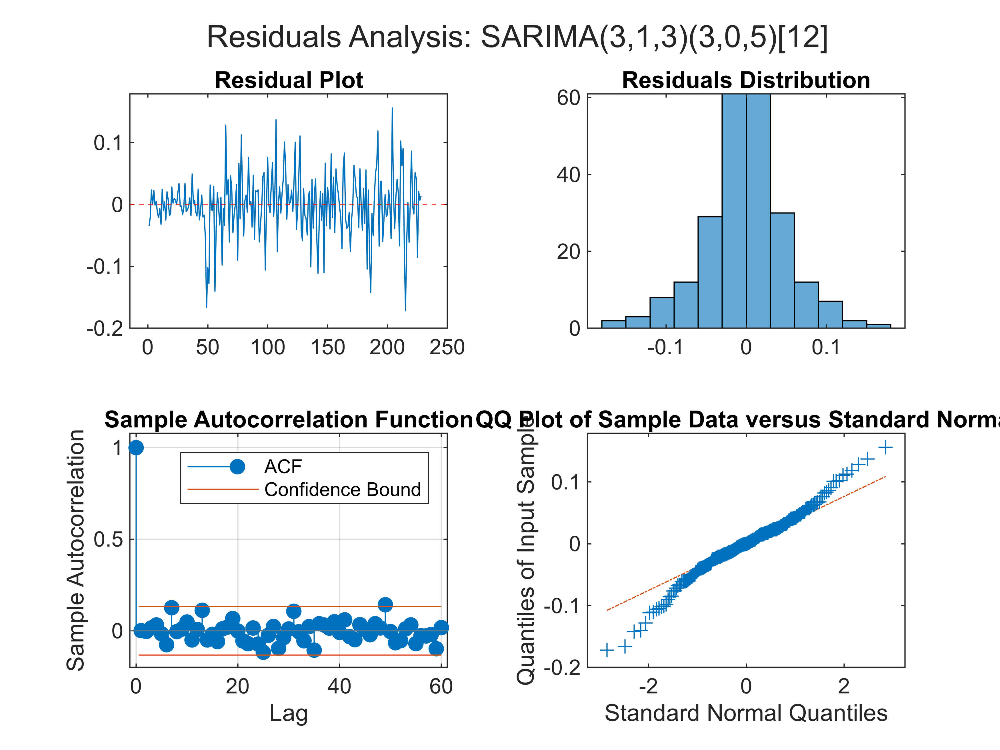

In [83]:
% Create tiled layout
figure
tiledlayout(2,2)
sgtitle("Residuals Analysis: SARIMA(3,1,3)(3,0,5)[12]")

% Plot residuals
nexttile
plot(SARIMAMdl.fit.residuals)
axis padded
yline(0,"Color","r","LineStyle","--")
title("Residual Plot")

% Plot residuals histogram
nexttile
histogram(SARIMAMdl.fit.residuals)
title("Residuals Distribution")

% Plot residuals acf
nexttile
autocorr(SARIMAMdl.fit.residuals,"NumLags",60)
axis padded

% Plot residuals qq-plot
nexttile
qqplot(SARIMAMdl.fit.residuals)
box on; axis padded


The charts above indicate that the residuals appear to follow a normal distribution and show no clear signs of autocorrelation.


Let's now plot the residuals versus the fitted value and look for correlation:



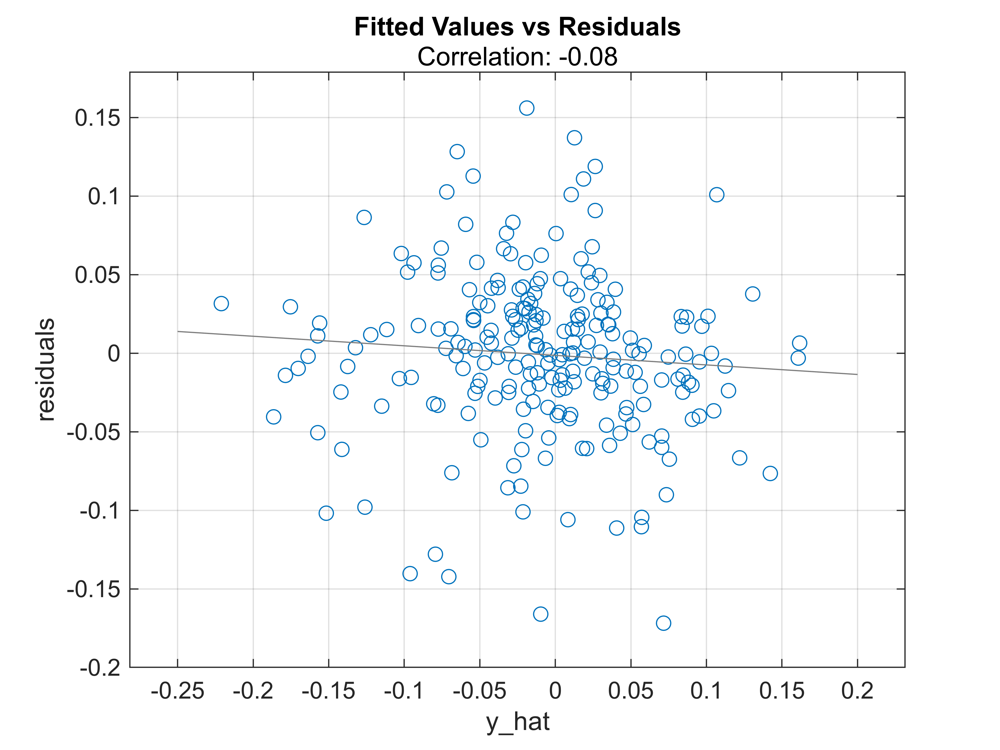

In [84]:
figure
scatter(SARIMAMdl.fit,"y_hat","residuals")
title("Fitted Values vs Residuals",sprintf('Correlation: %.2f',corr(SARIMAMdl.fit.y_hat,SARIMAMdl.fit.residuals)))
lsline
box on; grid on; axis padded


The correlation of <samp>corr = -0.08</samp> between residuals and fitted values is extremely low, suggesting minimal linear dependence and reinforcing the assumption of homoscedasticity.


By performining a **Lujung\-Box test** we can assess whether the residuals exhibit autocorrelation:


In [85]:
disp(lbqtest(SARIMAMdl.fit.residuals,"DataVariable","Y_Residual","Lags",60))

   0

In [86]:
aTest = archtest(SARIMAMdl.fit,DataVariable="residuals");
disp(aTest)

                h      pValue     stat     cValue    Lags    Alpha
              _____    ______    ______    ______    ____    _____
    Test 1    false    0.1208    2.4069    3.8415     1      0.05


Since the test result was false, it means that the test failed to reject the null hypothesis,i.e.the residuals do not show significant autocorrelation and model  produces residuals that behave like white noise, therefore our model effectively captures the time series pattern.

## Forecasting Data

Once the model was select, let's try forecasting the TEUs throughput in the Port of Santos for the next years


In [87]:
% Create Forecast table
% SARIMAFrcst = table;
% SARIMAFrcst.Time = frcst.Time;
% SARIMAFrcst.Idx = frcst.Idx;
%
% Capture long term and seasonal components previously modeled
% SARIMAFrcst.LongTermFrcst = frcst.LongTermFrcst;
% SARIMAFrcst.SeasFrcst = frcst.SeasFrcst;
%
% Forecast the data in the test time range
% [SARIMAFrcst.SARIMAFrcst, SARIMAFrcst.SARIMAResiduals] = forecast(SARIMAEst, frcstHorizon, remainingTS.Remainder);
%
% Sum of all components
% SARIMAFrcst.Sum = SARIMAFrcst.LongTermFrcst + SARIMAFrcst.SeasFrcst + SARIMAFrcst.SARIMAFrcst;
%
% Reversing log transformation
% SARIMAFrcst.TEUsForecast = exp(SARIMAFrcst.Sum);
%
% Calculate GoF metrics
% SARIMAMetrics = table;
% SARIMAMetrics.RMSE = rmse(SARIMAFrcst.TEUsForecast,actual); % Root mean squared error
% SARIMAMetrics.MAPE = mape(SARIMAFrcst.TEUsForecast,actual); % Mean absolute percentage error
% SARIMAMetrics.RRSE = sqrt(sum((SARIMAFrcst.TEUsForecast - actual).^2) / sum((actual - mean(actual)).^2)); % Root relative squared error
%
% disp(SARIMAMetrics)
% Plot the forecasted data
% Z = 1.96;
% CI = computeCI(SARIMAFrcst,longTermMdl,seasonalMdl,Z); % Compute confident intervals
%
% figure;
% plot(testData,"Time","TEUs")
% hold on
% plot(SARIMAFrcst, "Time","TEUsForecast")
%
% plot(CI,"Time","LowerConfInt","Color","k","LineStyle","--")
% plot(CI,"Time","UpperConfInt","Color","k","LineStyle","--")
% legend(["Actual","Forecast","95% IC"],"Location","Best")
% title("TEUs forecasted for Santos Port","Jan 2024 to Jan 2025")
% axis padded


We can now compare the yearly cumulative actual TEUs with the forecasted data.


In [88]:
% % Group the data yearly
% yearlyTestData = (groupsummary(testData,"Time","year","sum","TEUs"));
% yearlyForecastData = (groupsummary(SARIMAFrcst,"Time","year","sum","TEUsForecast"));
% testVersusForecast = join(yearlyTestData,yearlyForecastData,"Keys","year_Time","LeftVariables",["year_Time","sum_TEUs"],"RightVariables","sum_TEUsForecast");
% testVersusForecast.PercentError = testVersusForecast.sum_TEUsForecast ./ testVersusForecast.sum_TEUs - 1;
% disp(testVersusForecast)


The forecasted TEUs closely matched the actual observed values, with no difference in the amount for 2024 and a 2% underestimation in the first 2025 bimester.


Let's plot the entire series from January 2005 to January 2025, overlaying the forecast from January 2024 onward on the same graph.


In [89]:
% figure
% plot(trainData,"Time","TEUs")
% hold on
% plot(testData,"Time","TEUs","Color","#0072BD","LineStyle","-.")
% plot(SARIMAFrcst, "Time","TEUsForecast","Color","#D95319")
% plot(CI,"Time","LowerConfInt","Color","k","LineStyle","--")
% plot(CI,"Time","UpperConfInt","Color","k","LineStyle","--")
% legend(["Train data","Test data","Forecast","95% Confident intervals"],"Location","best")
% title("TEUs throughput in the Port of Santos")
% axis padded



Now, let's examine how the model forecasts data for the next 10 years, up to December 2024.



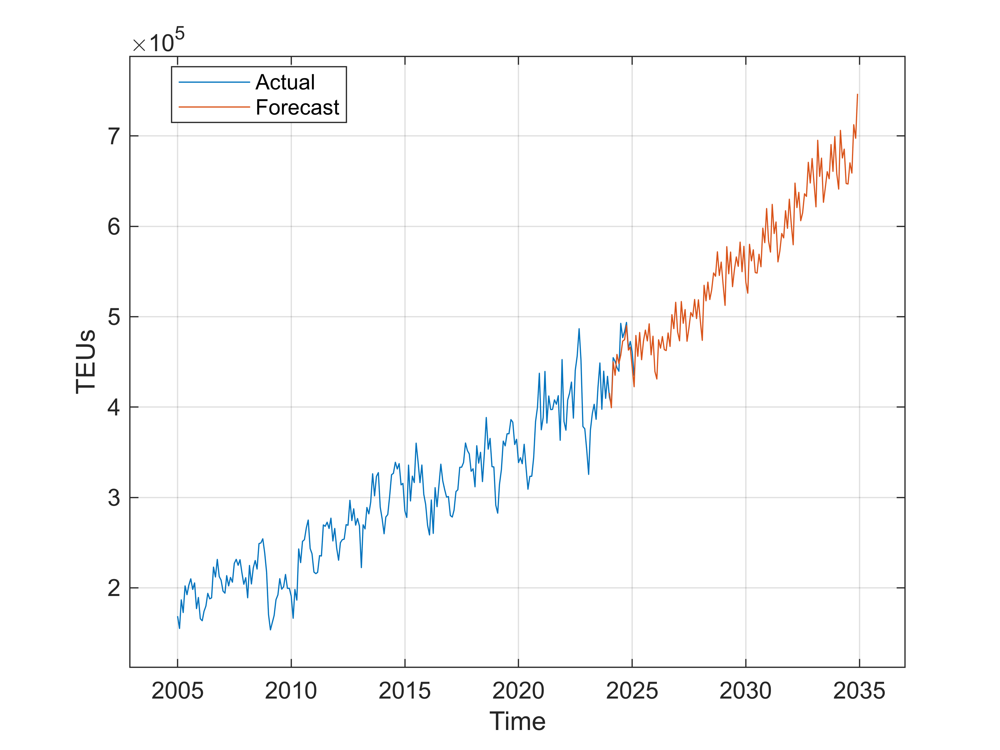

In [90]:
% Set the new forecast horizon
startDate = datetime(2024,1,1);
endDate = datetime(2034,12,1);
dateVector = startDate:calmonths(1):endDate;
newHorizon = length(dateVector);
horizonIdx = prev_idx+1:prev_idx+newHorizon;

% Data forecast
LongTermForecast = feval(long_term_mdl, horizonIdx);
SeasonalForecast = feval(seasonal_mdl, horizonIdx);
RemainingForecast = forecast(SARIMAMdl.y, newHorizon, remaining_series.remainder);

% Sum of components
ComponentsSum = LongTermForecast + SeasonalForecast + RemainingForecast;

% Reverse log transformation
TEUsForecast = exp(ComponentsSum);

% Plot the data
figure
plot(full_series,"Time","TEUs")
hold on
plot(dateVector,TEUsForecast)
axis padded
legend(["Actual","Forecast"],Location="best")
grid on

In [91]:

% Exibith Gof Metrics
% text(200,6e5,sprintf('RMSE = %.f',SARIMAMetrics.RMSE))
% text(200,5.5e5,sprintf("MAPE = %.1f%%",SARIMAMetrics.MAPE))
% text(200,5e5,sprintf('RRSE = %.2f',SARIMAMetrics.RRSE))
%
% title("10-year extrapolation forecast","2025 ~ 2034")


Let's now see the annual throughput and how it evolves over the year by ploty the sum of TEUs moved in Santos per year.


In [92]:
yearlyGroupedTEUs = table();
yearlyGroupedTEUs.Time = dateVector';
yearlyGroupedTEUs.TEUsForecast = TEUsForecast;
yearlyGroupedTEUs = groupsummary(yearlyGroupedTEUs,"Time","year","sum","TEUsForecast");
disp(yearlyGroupedTEUs)

    year_Time    GroupCount    sum_TEUsForecast
    _________    __________    ________________
      2024           12            5.431e+06   
      2025           12           5.5963e+06   
      2026           12           5.6684e+06   
      2027           12           5.9744e+06   
      2028           12           6.3795e+06   
      2029           12           6.6617e+06   
      2030           12           6.8013e+06   
      2031           12           7.1341e+06   
      2032           12           7.5723e+06   
      2033           12           7.9283e+06   
      2034           12           8.1467e+06


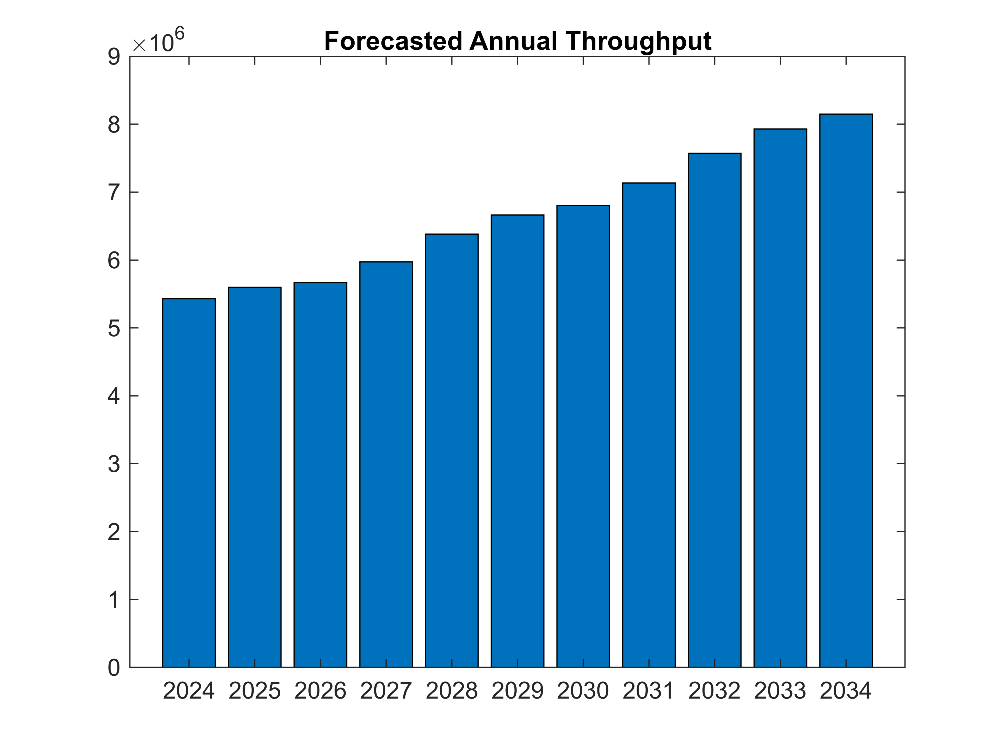

In [93]:
figure
bar(yearlyGroupedTEUs.year_Time,yearlyGroupedTEUs.sum_TEUsForecast)
title("Forecasted Annual Throughput")

In [94]:

% Compute CAGR
cagr = (yearlyGroupedTEUs(end,"sum_TEUsForecast") ./ yearlyGroupedTEUs(1,"sum_TEUsForecast")) .^ (1/10) - 1;
cagr = renamevars(cagr,"sum_TEUsForecast","CAGR");
disp(cagr)

      CAGR  
    ________
    0.041383


## Conclusions and Future Analysis

This study applies statistical methods to forecast the movement of TEUs at the Port of Santos. A public dataset provided by the Santos Port Authority, which includes historical data dating back to 2005, was used for the analysis. An exploratory data analysis (EDA) was conducted to understand the data, followed by necessary transformations to prepare it for forecasting. Several ARIMA and SARIMA models were tested, with the SARIMA(3,1,3)(3,1,5)\[12\] model yielding the best fit. This model demonstrated excellent performance on test data, achieving a mean absolute percentage error (MAPE) of 2.1%.


A 10\-year extrapolation was also conducted, revealing that the Port of Santos is expected to handle approximately 5.6 million TEUs in 2025, with an increase to 8.1 million TEUs by 2034. This growth corresponds to a compound annual growth rate (CAGR) of 4.1%. However, achieving this forecast will require significant investments in terminal infrastructure, as the current capacity is approaching saturation.


For future analysis, models incorporating exogenous variables—such as macroeconomic indicators and geopolitical factors—could be explored to improve the robustness of the forecasts.


In [95]:
% writetimetable(remaining_series,"serie_temporal.xlsx")